# TALLER CIENCIA DE DATOS

## Trabajo de Laboratorio - Equipo: Sinergia Team

![SinergiaTeam](https://i.pinimg.com/originals/69/8f/22/698f22997245222e7ee21f48fa981531.gif)

### Integrantes:
Julio Leiva -
Mariana Marrero -
Valeria Cardozo

## OBJETIVOS

Lograr un mejor entendimiento de los datos de las compras estatales realizadas durante el período 2018 para poder extraer conocimiento y anomalías que es lo que le interesa al Diario "El Durazno Post" para poder realizar su informe periodístico. Analizar los datos proporcionados para comprenderlos mejor y extraer conclusiones que nos permitan resolver los requerimientos planteados.

### Metodología

Vamos a utilizar la metodología **_CRISP-DM_** para transformar el problema de negocio en un proyecto de data sciences, haciendo incapié en las siguientes etapas:
*	Business understanding
*	Data understanding (adquisición de datos o ingesta de datos)
*	Data preparation

## ENTENDIMIENTO DEL NEGOCIO

Al Diario "El Durazno Post" le interesa lanzar un informe con datos confiables previo a las elecciones. Para ello quiere contar con información de interés y utilidad para sus lectores que incluyan las irregularidades en las compras estatales realizadas durante el último período de gobierno en 2018. Solicitan disponer de la siguiente información para poder analizar la viabilidad del informe periodístico:
* En qué se gasta el dinero de los contribuyentes. Determinar en qué tipo de objetivos el Estado gasta más dinero
* Informar al ciudadano en un lenguaje entendible, por lo que la información debe carecer de codificaciones.
* Irregularidades en el proceso de compra. Las compras del estado deben regirse bajo un marco regulatorio establecido por el T.O.C.A.F, ver cuáles incumplen con las condiciones que impone este organismo.


### Requerimientos del Negocio

Para poder obtener los resultados esperados por la visión del negocio se solicitan requerimientos específicos referidos a la **_Calidad de los Datos_** y su posterior **_Análisis_**

**CALIDAD DE DATOS**
* Analizar el contenido de los datos de los data set de Adquisiciones 2018, discriminando el análisis de variables contínuas y categóricas.
* Cantidad de adjudicaciones con precios inválidos. Discriminando los tipos de casos inválidos valores vacíos, 0, nulos.

**ANÁLISIS DE LOS DATOS**
* Las 20 organizaciones que gastaron más dinero (ordenados en forma descendente)
* Las 50 compras más caras
* Agregación del monto total por tipo de producto
* Las 10 unidades ejecutoras que más compraron en el período
* Compras directas mayores a "$436.000"


## ADQUISIÓN DE DATOS

En esta etapa vamos a realizar la cargamos los set de datos (archivos .csv) desde la fuente para poder explorarlos y comprenderlos mejor. A partir del primer contacto podremos ver que información es de relevancia para cumplir con los requerimientos del negocio y que datos importantes nos están faltando.

Nuestra fuente para obtener los datos para analizar son fuentes de datos abiertos correspondientes al catálogo de datos abiertos del Estado, puntualmente los conjuntos de datos de Adjudicaciones 2018 que contiene las compras realizadas por el Estado en dicho año.
Partimos de la carga de tres archivos con formato .csv, dos de ellos corresponden a las compras realizadas por semestre del año y el otro contiene los metadatos para poder inferir información. Además realizamos la carga de archivos de extensión .xml que cuentan con la información de todas las codigueras utilizadas en los archivos .csv para su mejor interpretación.

Hicimos uso de distintas librerías que provee R como **_downloader y dyplr_** para poder acceder a los archivos en los formatos especificados y manerajarlos en el entorno.

### DEPENDENCIAS

In [2]:
library(downloader) # Importar libreria downloader para descargar archivos desde la fuente
library(rvest)
library(xml2) # Para leer archivos XML
library(XML)  # Para leer archivos XML
library(RCurl)
library(methods)
library(dplyr) # Librería para manipular data frames
library(Hmisc) # Librería para sacar estadísticas
library(ggplot2)
library(DataExplorer)  # Librería para sacar estadísticas
library(tidyverse) # Manejo de filtros
library(tm)
library(SnowballC)
library(wordcloud)
library(RColorBrewer)

### RECOPILACIÓN E INGESTA DE DATOS

### INGESTA DE LOS SET DE DATOS .csv

#### Carga de los data set con los datos de las compras realizadas por el Estado en el período 2018

In [3]:
# Defino url a archivo CSV de Adquisiciones 1er Semestre 2018
urlAdqSem1 <- "https://catalogodatos.gub.uy/dataset/2e960213-f14f-4f51-832a-65ca25eb1b42/resource/9fc590fd-0d33-4478-9193-9c44906ca388/download/compras.csv"

# Descargo archivo CSV 
filenameAdqSem1 <- "compras.csv"
if (!file.exists(filenameAdqSem1)) 
    download(urlAdqSem1,filenameAdqSem1)

# Cargo datos del archivo
datosAdqSem1 <- read.csv(filenameAdqSem1,fileEncoding = "UTF-8")

# Exploración inicial de los datos
str(datosAdqSem1)
head(datosAdqSem1,5)

# Dependiendo del tipo de dato de la variable esta función nos proveerá de distinta información.
# Valores numéricos: muestra el minimo, 1er cuartil, mediana, media mean, 3er cuartil, y máximo. 
# Para variables categóricas (o de tipo texto), muestra el numero de veces que cada valor aparece en los datos (“level”).
summary(datosAdqSem1)

'data.frame':	27827 obs. of  22 variables:
 $ anio_compra          : int  2017 2017 2017 2017 2017 2017 2017 2017 2017 2017 ...
 $ apel                 : Factor w/ 3 levels "","N","S": 2 3 3 2 3 3 2 2 3 3 ...
 $ arch_adj             : Factor w/ 4525 levels "","acta_272196.PDF",..: 107 116 101 144 1 159 1 172 1 1 ...
 $ arch_reiteracion     : Factor w/ 97 levels "","reiter_600057.pdf",..: 1 1 1 1 1 1 1 1 1 1 ...
 $ es_reiteracion       : Factor w/ 2 levels "N","S": 1 1 1 1 1 1 1 1 1 1 ...
 $ estado_compra        : int  7 7 7 7 7 7 7 7 7 7 ...
 $ fecha_compra         : Factor w/ 366 levels "01/01/2018","01/02/2017",..: 254 142 226 311 332 311 332 179 86 153 ...
 $ fecha_pub_adj        : Factor w/ 13107 levels "01/02/2018 06:55",..: 915 892 353 1674 900 906 1244 863 313 361 ...
 $ fondos_rotatorios    : Factor w/ 2 levels "N","S": 1 1 1 1 1 1 1 1 1 1 ...
 $ id_compra            : int  620613 620880 620374 621095 621195 621246 621344 621496 621843 622084 ...
 $ id_inciso            : int  

anio_compra,apel,arch_adj,arch_reiteracion,es_reiteracion,estado_compra,fecha_compra,fecha_pub_adj,fondos_rotatorios,id_compra,...,id_tipo_resol,id_tipocompra,id_ue,monto_adj,nro_ampliacion,num_compra,num_resol,objeto,subtipo_compra,open_contracting_link
2017,N,acta_620613.pdf,,N,7,21/12/2017,03/01/2018 16:25,N,620613,...,1,LA,31,17910.00,0,12,1217,Adquisición de 1 camioneta para el Departamento de Ciencias Sociales del CENUR Litoral Norte - Sede Salto,COM,https://comprasestatales.gub.uy/ocds/record/620613
2017,S,acta_620880.doc,,N,7,12/12/2017,03/01/2018 12:45,N,620880,...,1,CD,103,12195.03,0,295,2952017,ADQUISICIÓN DE ARTÍCULOS DE SANITARIA. Importante leer el pliego de a compra para cotizar de forma correcta. Solo se aceptan cotizaciones en línea.,COM,https://comprasestatales.gub.uy/ocds/record/620880
2017,S,acta_620374.pdf,,N,7,19/12/2017,02/01/2018 15:00,N,620374,...,1,CD,16,12468.40,0,22,1,"Compra Directa de Cartuchos para Artes Gráficas, Cotizar en función del pliego ingresado. Las ofertas se reciben solo por la página de Compras Estatales.",COM,https://comprasestatales.gub.uy/ocds/record/620374
2017,N,acta_621095.docx,,N,7,26/12/2017,05/01/2018 10:30,N,621095,...,3,CP,1,0.00,0,5066,15,Contratación de empresa para colocación de relleno en wetland del Liceo de Empalme Olmos - Ver pliego y planos adjuntos - No se aceptan ofertas en línea,COM,https://comprasestatales.gub.uy/ocds/record/621095
2017,S,,,N,7,28/12/2017,03/01/2018 14:15,N,621195,...,1,CD,103,13908.00,0,33550,0,"1 Agitador lineal, con capacidad máxima de carga de 7kgs, temporizador y regulador de velocidad, 220volt Leer adjunto.-",COM,https://comprasestatales.gub.uy/ocds/record/621195


  anio_compra   apel                  arch_adj              arch_reiteracion
 Min.   :2010    :20412                   :23303                    :27731  
 1st Qu.:2018   N: 3090   acta_272196.PDF :    1   reiter_600057.pdf:    1  
 Median :2018   S: 4325   acta_538986.docx:    1   reiter_600821.pdf:    1  
 Mean   :2018             acta_548320.pdf :    1   reiter_610116.pdf:    1  
 3rd Qu.:2018             acta_557794.pdf :    1   reiter_611268.doc:    1  
 Max.   :2018             acta_558980.pdf :    1   reiter_615344.pdf:    1  
                          (Other)         : 4519   (Other)          :   91  
 es_reiteracion estado_compra     fecha_compra            fecha_pub_adj  
 N:27731        Min.   :7     02/01/2018:  352   11/04/2018 14:15:   24  
 S:   96        1st Qu.:7     30/04/2018:  324   02/02/2018 12:40:   17  
                Median :7     31/05/2018:  307   02/02/2018 13:15:   11  
                Mean   :7     23/02/2018:  282   02/04/2018 12:59:   11  
              

In [4]:
# Defino url a archivo CSV de Adquisiciones 2do Semestre 2018
urlAdqSem2 <- "https://catalogodatos.gub.uy/dataset/2e960213-f14f-4f51-832a-65ca25eb1b42/resource/557ee115-34ca-417c-9734-e0862e2d117a/download/compras2018_2do.csv"

# Descargo archivo CSV 
filenameAdqSem2 <- "compras2018_2do.csv"
if (!file.exists(filenameAdqSem2)) 
    download(urlAdqSem2,filenameAdqSem2)

# Cargo datos del archivo
datosAdqSem2 <- read.csv(filenameAdqSem2,fileEncoding = "UTF-8")

# Exploración inicial de los datos
str(datosAdqSem2)
head(datosAdqSem2,5)

# Dependiendo del tipo de dato de la variable esta función nos proveerá de distinta información.
# Valores numéricos: muestra el minimo, 1er cuartil, mediana, media mean, 3er cuartil, y máximo. 
# Para variables categóricas (o de tipo texto), muestra el numero de veces que cada valor aparece en los datos (“level”).
summary(datosAdqSem2)


'data.frame':	27546 obs. of  22 variables:
 $ anio_compra          : int  2018 2018 2018 2018 2018 2018 2018 2018 2018 2018 ...
 $ apel                 : Factor w/ 3 levels "","N","S": 2 2 3 1 1 1 2 3 1 1 ...
 $ arch_adj             : Factor w/ 5615 levels "","acta_537895.PDF",..: 214 216 187 1 1 1 1 1 1 1 ...
 $ arch_reiteracion     : Factor w/ 96 levels "","reiter_604908.pdf",..: 1 1 1 1 1 1 1 1 1 1 ...
 $ es_reiteracion       : Factor w/ 2 levels "N","S": 1 1 1 1 1 1 1 1 1 1 ...
 $ estado_compra        : int  7 7 7 7 7 7 7 7 7 7 ...
 $ fecha_compra         : Factor w/ 312 levels "01/01/2018","01/02/2018",..: 257 257 255 6 98 202 8 232 246 146 ...
 $ fecha_pub_adj        : Factor w/ 11570 levels "01/08/2018 07:25",..: 11259 11260 24 9433 9434 9434 1 9409 9435 9436 ...
 $ fondos_rotatorios    : Factor w/ 2 levels "N","S": 1 1 1 1 1 1 1 1 1 1 ...
 $ id_compra            : int  637079 637085 636213 664776 664773 661416 664781 654062 664783 664790 ...
 $ id_inciso            : int  29 29

anio_compra,apel,arch_adj,arch_reiteracion,es_reiteracion,estado_compra,fecha_compra,fecha_pub_adj,fondos_rotatorios,id_compra,...,id_tipo_resol,id_tipocompra,id_ue,monto_adj,nro_ampliacion,num_compra,num_resol,objeto,subtipo_compra,open_contracting_link
2018,N,acta_637079.pdf,,N,7,26/07/2018,31/07/2018 14:35,N,637079,...,4,LA,30,0.00,0,2,30,SERVICIO DE CAMILLEROS,COM,https://comprasestatales.gub.uy/ocds/record/637079
2018,N,acta_637085.pdf,,N,7,26/07/2018,31/07/2018 14:40,N,637085,...,4,LA,30,0.00,0,4,27,SERVICIO DE LAVADO Y PLANCHADO,COM,https://comprasestatales.gub.uy/ocds/record/637085
2018,S,acta_636213.pdf,,N,7,26/04/2018,01/08/2018 10:20,N,636213,...,1,LA,76,1010160.00,0,10,3122018,MANTENIMIENTO DE LAS REDES DE GASES MEDICINALES,COM,https://comprasestatales.gub.uy/ocds/record/636213
2018,,,,N,7,01/06/2018,27/07/2018 11:20,N,664776,...,1,CD,5,28274.72,0,5018,5018,DGSG. RECARGAS DE GARRAFA A SUPERGAS - AÑO:2018,COM,https://comprasestatales.gub.uy/ocds/record/664776
2018,,,,N,7,10/05/2018,27/07/2018 11:25,N,664773,...,1,CD,1,983.81,0,282,0,Frascos de cola adhesiva.,COM,https://comprasestatales.gub.uy/ocds/record/664773


  anio_compra   apel                 arch_adj              arch_reiteracion
 Min.   :2016    :18599                  :21932                    :27451  
 1st Qu.:2018   N: 3250   acta_537895.PDF:    1   reiter_604908.pdf:    1  
 Median :2018   S: 5697   acta_601368.pdf:    1   reiter_629514.pdf:    1  
 Mean   :2018             acta_603429.pdf:    1   reiter_632135.pdf:    1  
 3rd Qu.:2018             acta_604908.pdf:    1   reiter_632679.pdf:    1  
 Max.   :2019             acta_607912.pdf:    1   reiter_634530.pdf:    1  
                          (Other)        : 5609   (Other)          :   90  
 es_reiteracion estado_compra     fecha_compra            fecha_pub_adj  
 N:27451        Min.   :7     31/07/2018:  308   08/10/2018 12:33:   50  
 S:   95        1st Qu.:7     20/08/2018:  297   08/10/2018 12:32:   38  
                Median :7     01/08/2018:  293   08/10/2018 12:30:   34  
                Mean   :7     28/11/2018:  292   26/07/2018 13:50:   27  
                3rd Qu

In [5]:
#Comprobamos que tengan las mismas variables ambos dataset y en el mismo orden
names(datosAdqSem1)
names(datosAdqSem2)

[1] "anio_compra"           "apel"                  "arch_adj"             
 [4] "arch_reiteracion"      "es_reiteracion"        "estado_compra"        
 [7] "fecha_compra"          "fecha_pub_adj"         "fondos_rotatorios"    
[10] "id_compra"             "id_inciso"             "id_moneda_monto_adj"  
[13] "id_tipo_resol"         "id_tipocompra"         "id_ue"                
[16] "monto_adj"             "nro_ampliacion"        "num_compra"           
[19] "num_resol"             "objeto"                "subtipo_compra"       
[22] "open_contracting_link"

[1] "anio_compra"           "apel"                  "arch_adj"             
 [4] "arch_reiteracion"      "es_reiteracion"        "estado_compra"        
 [7] "fecha_compra"          "fecha_pub_adj"         "fondos_rotatorios"    
[10] "id_compra"             "id_inciso"             "id_moneda_monto_adj"  
[13] "id_tipo_resol"         "id_tipocompra"         "id_ue"                
[16] "monto_adj"             "nro_ampliacion"        "num_compra"           
[19] "num_resol"             "objeto"                "subtipo_compra"       
[22] "open_contracting_link"

#### Unificamos los dos data set en un único dataframe para contar con la información centralizada
Una vez que comprobamos que los nombres de las columnas (variables), son iguales y están en el mismo orden, lo que queremos es unir las filas de una data frame con el de otro. Entonces usando el comando **_rbind_**

In [6]:
datosComprasEstatales2018 <- rbind(datosAdqSem1, datosAdqSem2)

#Verificamos la estructura del nuevo data frame
str(datosComprasEstatales2018)
names(datosComprasEstatales2018)

'data.frame':	55373 obs. of  22 variables:
 $ anio_compra          : int  2017 2017 2017 2017 2017 2017 2017 2017 2017 2017 ...
 $ apel                 : Factor w/ 3 levels "","N","S": 2 3 3 2 3 3 2 2 3 3 ...
 $ arch_adj             : Factor w/ 10139 levels "","acta_272196.PDF",..: 107 116 101 144 1 159 1 172 1 1 ...
 $ arch_reiteracion     : Factor w/ 192 levels "","reiter_600057.pdf",..: 1 1 1 1 1 1 1 1 1 1 ...
 $ es_reiteracion       : Factor w/ 2 levels "N","S": 1 1 1 1 1 1 1 1 1 1 ...
 $ estado_compra        : int  7 7 7 7 7 7 7 7 7 7 ...
 $ fecha_compra         : Factor w/ 538 levels "01/01/2018","01/02/2017",..: 254 142 226 311 332 311 332 179 86 153 ...
 $ fecha_pub_adj        : Factor w/ 24677 levels "01/02/2018 06:55",..: 915 892 353 1674 900 906 1244 863 313 361 ...
 $ fondos_rotatorios    : Factor w/ 2 levels "N","S": 1 1 1 1 1 1 1 1 1 1 ...
 $ id_compra            : int  620613 620880 620374 621095 621195 621246 621344 621496 621843 622084 ...
 $ id_inciso            : int

[1] "anio_compra"           "apel"                  "arch_adj"             
 [4] "arch_reiteracion"      "es_reiteracion"        "estado_compra"        
 [7] "fecha_compra"          "fecha_pub_adj"         "fondos_rotatorios"    
[10] "id_compra"             "id_inciso"             "id_moneda_monto_adj"  
[13] "id_tipo_resol"         "id_tipocompra"         "id_ue"                
[16] "monto_adj"             "nro_ampliacion"        "num_compra"           
[19] "num_resol"             "objeto"                "subtipo_compra"       
[22] "open_contracting_link"

Como se puede ver ahora contiene 55373 observaciones correspondientes a la suma de 27827 del data frame **_ datosAdqSem1_** + 27546 del data frame **_ datosAdqSem2_**.
Las columnas continuan siendo 22

#### Carga del archivo. csv con los Metadatos de las Adquisiciones 2018

In [7]:
# Defino url a archivo CSV de Metadatos de las adquisiciones 2018
urlMetadatosAdj <- "https://catalogodatos.gub.uy/dataset/2e960213-f14f-4f51-832a-65ca25eb1b42/resource/8c706bdb-2493-45a8-b265-f8ab07cd9a9d/download/metadatos-adjudicaciones.csv"

# Descargo archivo CSV 
filenameMetadatosAdj <- "metadatos-adjudicaciones.csv"
if (!file.exists(filenameMetadatosAdj)) 
    download(urlMetadatosAdj,filenameMetadatosAdj)

# Cargo datos del archivo
delim = ";" 
dec = "."
quote = "\""
metadatosAdj <- read.csv(filenameMetadatosAdj, header=TRUE, sep=delim, quote=quote, dec=dec)

# Imprimo primeras filas del CSV
str(metadatosAdj)
head(metadatosAdj,10)

'data.frame':	22 obs. of  4 variables:
 $ Campo              : Factor w/ 22 levels "anio_compra",..: 1 2 3 4 5 6 7 8 9 10 ...
 $ Tipo               : Factor w/ 3 levels "Fecha","Numérico",..: 2 3 3 3 3 2 1 1 3 2 ...
 $ Descripción        : Factor w/ 22 levels "Año de la compra",..: 1 13 17 16 14 2 4 3 12 5 ...
 $ Recurso.Relacionado: Factor w/ 8 levels "","https://catalogodatos.gub.uy/dataset/compras-estatales/resource/0cb1e938-bc0f-41ac-98f3-8fb67681f6b7",..: 1 1 1 1 1 3 1 1 1 1 ...


Campo,Tipo,Descripción,Recurso.Relacionado
anio_compra,Numérico,Año de la compra,
apel,Texto,"Indica si la modalidad de apertura es electrónica (valores posibles: ""S"" o ""N"")",
arch_adj,Texto,Nombre del archivo de resolución de adjudicación,
arch_reiteracion,Texto,Nombre del archivo de reiteración del gasto,
es_reiteracion,Texto,"Indica si se reitera el gasto (valores posibles: ""S"" o ""N"")",
estado_compra,Numérico,Código del estado de la compra,https://catalogodatos.gub.uy/dataset/compras-estatales/resource/2dc49850-e2b5-434f-8c81-4c91ad1394bf
fecha_compra,Fecha,Fecha de la compra,
fecha_pub_adj,Fecha,Fecha de la adjudicación,
fondos_rotatorios,Texto,"Indica si la compra es por fondos rotatorios (valores posibles: ""S"" o ""N"")",
id_compra,Numérico,Identificador de compra,


A partir del primer acercamiento con los datos comenzamos a identificar algunos problemas o desafios como:
* Disponibilidad de los datos: Si bien se tratan de datos abiertos y sin restricción de acceso la web desde donde se descargan tiene períodos de inactividad bastante continuos por lo que decidimos descargarlos.
* Los data set tienen gran volumen de datos: En el caso de las **_Compras del Primer Semestre_** son 27827 registros con 22 variables diferentes, mientras que para **_Compras del Segundo Semestre_** son 27546 observaciones con las mismas 22 variables.
Para asegurarnos de que se trataba de los mismos atributos en ambos data set (para luego poder unificarlos) comparamos ambos head.
* Dificil entendimiento de algunas variables, no comprendemos que dato almacenan, por ello vamos a requerir acceder a los metadatos para aclarar términos.
* Tuvimos problemas de encoding y escapeo de caracteres por lo que tuvimos que realizar un pre procesado para la carga

### INGESTA DE LOS METADATOS .xml
A continuación se procesan los archivos en formato XML, se extraer su información y se carga en un data frame para su posterior uso.

#### Carga de Descripción de Estados de Compra

In [8]:
#Codiguera con la descripcion de estados de compra
fileURL <- "http://www.comprasestatales.gub.uy/comprasenlinea/jboss/reporteEstadosCompra.do" # Ubicación del archivo XML

xData <- getURL(fileURL, ssl.verifypeer = FALSE)
doc <- xmlParse(xData)

dfEstadosCompra <- as.data.frame(t(xmlSApply(doc["/estados-compra/estado-compra"],xmlAttrs)),stringsAsFactors=FALSE)

for (col in colnames(dfEstadosCompra)){
  Encoding(dfEstadosCompra[[col]]) <- "UTF-8"}

str(dfEstadosCompra)
dfEstadosCompra


'data.frame':	7 obs. of  2 variables:
 $ id         : chr  "4" "5" "7" "11" ...
 $ descripcion: chr  "EN TRÁMITE (PUBLICADA)" "EN TRÁMITE (ESTUDIO)" "ADJUDICADA" "EN TRÁMITE (OFERTAS PREPARADAS)" ...


id,descripcion
4,EN TRÁMITE (PUBLICADA)
5,EN TRÁMITE (ESTUDIO)
7,ADJUDICADA
11,EN TRÁMITE (OFERTAS PREPARADAS)
17,ADJUDICADA (CON AMPLIACIÓN)
19,LLAMADO ANULADO
27,ADJUDICADA (CON RENOVACIÓN)


#### Carga de Descripción de Incisos

In [9]:
#Codiguera con la descripcion de Incisos
fileURL <- "http://www.comprasestatales.gub.uy/comprasenlinea/jboss/reporteIncisos.do" # Ubicación del archivo XML

dataIncisos <- getURL(fileURL, ssl.verifypeer = FALSE)
doc <- xmlParse(dataIncisos)

dfIncisos <- as.data.frame(t(xmlSApply(doc["/incisos/inciso"],xmlAttrs)),stringsAsFactors=FALSE)

for (col in colnames(dfIncisos)){
  Encoding(dfIncisos[[col]]) <- "UTF-8"}

str(dfIncisos)
dfIncisos

'data.frame':	64 obs. of  2 variables:
 $ id-inciso : chr  "1" "2" "3" "4" ...
 $ nom-inciso: chr  "Poder Legislativo" "Presidencia de la República" "Ministerio de Defensa Nacional" "Ministerio del Interior" ...


id-inciso,nom-inciso
1,Poder Legislativo
2,Presidencia de la República
3,Ministerio de Defensa Nacional
4,Ministerio del Interior
5,Ministerio de Economía y Finanzas
6,Ministerio de Relaciones Exteriores
7,"Ministerio de Ganadería, Agricultura y Pesca"
8,"Ministerio de Industria, Energía y Minería"
9,Ministerio de Turismo
10,Ministerio de Transporte y Obras Públicas


#### Carga de Descripción de Monedas

In [10]:
#Codiguera con la descripcion de Monedas
fileURL <- "http://www.comprasestatales.gub.uy/comprasenlinea/jboss/reporteMonedas.do" # Ubicación del archivo XML

dataMonedas <- getURL(fileURL, ssl.verifypeer = FALSE)
doc <- xmlParse(dataMonedas)

dfMonedas <- as.data.frame(t(xmlSApply(doc["/monedas/moneda"],xmlAttrs)),stringsAsFactors=FALSE)

for (col in colnames(dfMonedas)){
  Encoding(dfMonedas[[col]]) <- "UTF-8"}

str(dfMonedas)
dfMonedas

'data.frame':	53 obs. of  4 variables:
 $ id-moneda          : chr  "0" "1" "2" "3" ...
 $ desc-moneda        : chr  "PESOS URUGUAYOS" "DOLAR PIZARRA VENDEDOR" "DOLAR INTERBANCARIO VENDEDOR" "FRANCO FRANCES" ...
 $ sigla-moneda       : chr  "$" "U$S" "U$S" "FF" ...
 $ id-moneda-arbitraje: chr  "0" "1" "1" "2" ...


id-moneda,desc-moneda,sigla-moneda,id-moneda-arbitraje
0,PESOS URUGUAYOS,$,0
1,DOLAR PIZARRA VENDEDOR,U$S,1
2,DOLAR INTERBANCARIO VENDEDOR,U$S,1
3,FRANCO FRANCES,FF,2
4,UNIDAD INDEXADA,UNIDAD INDEXADA,0
5,UNIDAD REAJUSTABLE,UR,0
6,MARCO ALEMAN,DM,2
7,FRANCO BELGA,FB,2
8,DOLAR CANADIENSE,DC,2
9,PESETAS,PTS,2


#### Carga de Descripción de Objetos de Gasto

In [11]:
#Codiguera con la descripcion de Objetos de Gasto
fileURL <- "http://www.comprasestatales.gub.uy/comprasenlinea/jboss/reporteObjetosGasto.do" # Ubicación del archivo XML

dataObjetosGasto <- getURL(fileURL, ssl.verifypeer = FALSE)
doc <- xmlParse(dataObjetosGasto)

dfObjetosGasto <- as.data.frame(t(xmlSApply(doc["/objetos-gasto/objeto-gasto"],xmlAttrs)),stringsAsFactors=FALSE)

for (col in colnames(dfObjetosGasto)){
  Encoding(dfObjetosGasto[[col]]) <- "UTF-8"}

str(dfObjetosGasto)
dfObjetosGasto

'data.frame':	179 obs. of  2 variables:
 $ odg        : chr  "111000" "112000" "113000" "114000" ...
 $ descripcion: chr  "ALIMENTOS PARA PERSONAS" "ALIMENTOS PARA ANIMALES" "PRODUCTOS PECUARIOS" "PRODUCTOS AGROFORESTALES Y SUS MANUFACTURAS" ...


odg,descripcion
111000,ALIMENTOS PARA PERSONAS
112000,ALIMENTOS PARA ANIMALES
113000,PRODUCTOS PECUARIOS
114000,PRODUCTOS AGROFORESTALES Y SUS MANUFACTURAS
115000,MATERIA PRIMA AGROPECUARIA Y FORESTAL
116000,MATERIAS PRIMAS DE ORIGEN ACUÁTICO
119000,OTROS PROD ALIMENTICIOS AGROPECUARIOS Y FORESTALES
121000,HILADOS Y TELAS
122000,PRENDAS DE VESTIR
123000,CONFECCIONES TEXTILES


Función auxiliar me permite extraer una lista de nodos XML de igual tipo, indicando el nombre del tag XML que quiero extraer. La información que se extrae es la correspondiente a los atributos del tag, utilizando el nombre de los atributos del tag para las columnas del data frame.

In [12]:
# Parse XML To DataFrame starting from xmlDoc and the node type of the target
xml2DataFrame <- function(xmldoc, nodeType) {
    # Fetch rootNode
    rootNode <- xmlRoot(xmldoc)

    # Get all nodes of specified type
    targetNodes <- xmlElementsByTagName(rootNode, nodeType, recursive = FALSE)
    
    # Examine first row in targetNodes to build dataFrame
    sample <- first(targetNodes)
    attrs = xmlAttrs(sample)
    dfLength <- length(names(attrs))
    dfColNames <- names(attrs)
    
    # Create dataFrame from sample attrs names as columnNames
    df <- data.frame(matrix(ncol = dfLength, nrow = 0))
    colnames(df) <-dfColNames

    # For each targetNode extract attributes and create new row in dataframe
    for (node in targetNodes)
    {
        attrs <- xmlAttrs(node)
        df[nrow(df) + 1,] = attrs[1:dfLength] # %>% select(1:dfLength)
    }
    
    return(df)
}

#### Carga de Descripción de Subtipos de Compra

In [13]:
#Codiguera con la descripcion de Subtipos de Compra
fileURL <- "http://www.comprasestatales.gub.uy/comprasenlinea/jboss/reporteSubTiposCompra.do" # Ubicación del archivo XML

dataSubtiposCompra <- getURL(fileURL, ssl.verifypeer = FALSE)
doc <- xmlParse(dataSubtiposCompra)

nodeName <- "subtipo-compra"

dfSubtiposCompra <- xml2DataFrame(doc, nodeName)

for (col in colnames(dfSubtiposCompra)){
  Encoding(dfSubtiposCompra[[col]]) <- "UTF-8"}

str(dfSubtiposCompra)
dfSubtiposCompra

'data.frame':	138 obs. of  8 variables:
 $ id                  : chr  "18980" "2-1" "33" "33-1" ...
 $ id-tipocompra       : chr  "CE" "PE" "CE" "CE" ...
 $ resumen             : chr  "Ley 18.980: Régimen de excepción para la ANP" "Art.2, R.794/007 - UTE: Contratación Parque de Vacaciones" "Art. 33: Para adquirir bienes o contratar servicios por parte de la Un. Oper. Central del Plan Juntos" "Art. 33, 1: Contratación entre organismos o dependencias del Estado" ...
 $ cond-precios-ofertas: chr  "x>=0" "N" "x>=0" "N" ...
 $ fecha-baja          : chr  "" "x>=0" "31/05/2012 00:00" "x>=0" ...
 $ prov-rupe           : chr  "S" "" "S" "" ...
 $ pub-adj             : chr  "S" "S" "S" "N" ...
 $ cant-adj            : chr  "S" "S" "S" "S" ...


id,id-tipocompra,resumen,cond-precios-ofertas,fecha-baja,prov-rupe,pub-adj,cant-adj
18980,CE,Ley 18.980: Régimen de excepción para la ANP,x>=0,,S,S,S
2-1,PE,"Art.2, R.794/007 - UTE: Contratación Parque de Vacaciones",N,x>=0,,S,S
33,CE,Art. 33: Para adquirir bienes o contratar servicios por parte de la Un. Oper. Central del Plan Juntos,x>=0,31/05/2012 00:00,S,S,S
33-1,CE,"Art. 33, 1: Contratación entre organismos o dependencias del Estado",N,x>=0,,N,S
33-10,CE,"Art. 33, 10: Notoria escasez de los bienes o servicios a contratar",N,x>=0,,S,S
33-11,CE,"Art. 33, 11: Adquisición de bienes en remates públicos",N,x>=0,,N,S
33-12,CE,"Art. 33, 12: Compra de semovientes por selección",N,x>=0,,S,S
33-13,CE,"Art. 33, 13: Fomento económico o satisfacción de necesidades sanitarias",N,x>=0,,S,S
33-14,CE,"Art. 33, 14: Material docente o bibliográfico del exterior",N,x>=0,,S,S
33-15,CE,"Art. 33, 15: Adquisición de víveres frescos directamente a productores",x>=0,,S,S,S


#### Carga de Descripción de Tipos de Compra

In [14]:
#Codiguera con la descripcion de Tipos de Compra
fileURL <- "http://www.comprasestatales.gub.uy/comprasenlinea/jboss/reporteTiposCompra.do" # Ubicación del archivo XML

dataTiposCompra <- getURL(fileURL, ssl.verifypeer = FALSE)
doc <- xmlParse(dataTiposCompra)

nodeName <- "tipo-compra"

dfTiposCompra <- xml2DataFrame(doc, nodeName)

for (col in colnames(dfTiposCompra)){
  Encoding(dfTiposCompra[[col]]) <- "UTF-8"}

str(dfTiposCompra)
dfTiposCompra


'data.frame':	20 obs. of  9 variables:
 $ id                    : chr  "CD" "CE" "CM" "CO" ...
 $ descripcion           : chr  "Compra Directa" "Compra por Excepción" "Convenio Marco" "Concesión" ...
 $ oferta-economica      : chr  "S" "S" "S" "S" ...
 $ acto-apertura         : chr  "N" "48" "S" "S" ...
 $ resolucion-obligatoria: chr  "N" "S" "120" "48" ...
 $ solics-llamado        : chr  "N" "S" "S" "S" ...
 $ ampliaciones          : chr  "S" "N" "S" "S" ...
 $ tope-legal            : chr  "S" "N" "N" "S" ...
 $ pcpd                  : chr  "N" NA "N" "N" ...


id,descripcion,oferta-economica,acto-apertura,resolucion-obligatoria,solics-llamado,ampliaciones,tope-legal,pcpd
CD,Compra Directa,S,N,N,N,S,S,N
CE,Compra por Excepción,S,48,S,S,N,N,NA
CM,Convenio Marco,S,S,120,S,S,N,N
CO,Concesión,S,S,48,S,S,S,N
CP,PFI - Comparación de precios,N,N,N,N,S,N,N
DI,PFI - Contratación directa,N,N,N,N,S,N,N
EI,Llamado a Expresiones de Interés,N,N,48,N,S,N,N
LA,Licitación Abreviada,S,S,48,S,S,S,S
LI,PFI - Licitación pública internacional,S,S,S,S,S,N,N
LL,PFI - Licitación internacional limitada,S,S,S,S,S,N,N


#### Carga de Descripción de Tipos de Documentos de Proveedores

In [15]:
#Codiguera con la descripcion de Tipos de Documentos de Proveedores
fileURL <- "http://www.comprasestatales.gub.uy/comprasenlinea/jboss/reporteTiposDocumento.do" # Ubicación del archivo XML

dataTiposDocProv <- getURL(fileURL, ssl.verifypeer = FALSE)
doc <- xmlParse(dataTiposDocProv)

dfTiposDocProveedor <- as.data.frame(t(xmlSApply(doc["/tipos-doc/tipo-doc"],xmlAttrs)),stringsAsFactors=FALSE)

for (col in colnames(dfTiposDocProveedor)){
  Encoding(dfTiposDocProveedor[[col]]) <- "UTF-8"}

str(dfTiposDocProveedor)
dfTiposDocProveedor

'data.frame':	8 obs. of  4 variables:
 $ tipo       : chr  "C" "E" "G" "N" ...
 $ descripcion: chr  "Cédula" "Cédula Extranjera" "Genérico" "NIE" ...
 $ prov-rupe  : chr  "S" "S" "N" "S" ...
 $ pcpd       : chr  "N" "N" "N" "N" ...


tipo,descripcion,prov-rupe,pcpd
C,Cédula,S,N
E,Cédula Extranjera,S,N
G,Genérico,N,N
N,NIE,S,N
P,Pasaporte,S,N
R,RUT,S,S
T,Propio de Tesorería,N,N
X,Empresa Extranjera,S,N


#### Carga de Descripción de Tipos de Resolución

In [16]:
#Codiguera con la descripcion de Tipos de Resolucion
fileURL <- "http://www.comprasestatales.gub.uy/comprasenlinea/jboss/reporteTiposResolucion.do" # Ubicación del archivo XML

dataTipoResolucion <- getURL(fileURL, ssl.verifypeer = FALSE)
doc <- xmlParse(dataTipoResolucion)

dfTipoResolucion <- as.data.frame(t(xmlSApply(doc["/tipos-res/tipo-res"],xmlAttrs)),stringsAsFactors=FALSE)

for (col in colnames(dfTipoResolucion)){
  Encoding(dfTipoResolucion[[col]]) <- "UTF-8"}

str(dfTipoResolucion)
dfTipoResolucion

'data.frame':	7 obs. of  2 variables:
 $ id         : chr  "1" "2" "3" "4" ...
 $ descripcion: chr  "Adjudicada totalmente" "Adjudicada parcialmente" "Declarada desierta" "Declarada sin efecto" ...


id,descripcion
1,Adjudicada totalmente
2,Adjudicada parcialmente
3,Declarada desierta
4,Declarada sin efecto
5,Lista corta seleccionada
6,Resultado de la convocatoria
7,Todas las ofertas rechazadas


#### Carga de Descripción de Unidad de Compra Centralizadas

In [17]:
#Codiguera con la descripcion de Unidad de Compra Centralizada
fileURL <- "http://www.comprasestatales.gub.uy/comprasenlinea/jboss/reporteUCCs.do" # Ubicación del archivo XML

dataUCC <- getURL(fileURL, ssl.verifypeer = FALSE)
doc <- xmlParse(dataUCC)

dfUCC <- as.data.frame(t(xmlSApply(doc["/unidades-compra-centralizadas/unidad-compra-centralizada"],xmlAttrs)),stringsAsFactors=FALSE)

for (col in colnames(dfUCC)){
  Encoding(dfUCC[[col]]) <- "UTF-8"}

str(dfUCC)
dfUCC

'data.frame':	23 obs. of  2 variables:
 $ id-ucc : chr  "1" "2" "21" "43" ...
 $ nom-ucc: chr  "UCAMAE (Medicamentos)" "UCAA (Alimentos)" "UCC MTOP" "UCC MSP" ...


id-ucc,nom-ucc
1,UCAMAE (Medicamentos)
2,UCAA (Alimentos)
21,UCC MTOP
43,UCC MSP
44,MSP 35/43/47/53
45,Etchepare y S.C.Rossi
48,UCA
49,UCC MGAP
52,UCC Armada
53,UCC MI


#### Carga de Descripción de Unidad Ejecutora

In [18]:
#Codiguera con la descripcion de Unidad Ejecutora
fileURL <- "http://www.comprasestatales.gub.uy/comprasenlinea/jboss/reporteUnidadesEjecutoras.do" # Ubicación del archivo XML

dataUnidadEjecutora <- getURL(fileURL, ssl.verifypeer = FALSE)
doc <- xmlParse(dataUnidadEjecutora)

dfUnidadEjecutora <- as.data.frame(t(xmlSApply(doc["/unidades-ejecutoras/unidad-ejecutora"],xmlAttrs)),stringsAsFactors=FALSE)

for (col in colnames(dfUnidadEjecutora)){
  Encoding(dfUnidadEjecutora[[col]]) <- "UTF-8"}

str(dfUnidadEjecutora)
dfUnidadEjecutora

'data.frame':	427 obs. of  3 variables:
 $ id-inciso: chr  "1" "1" "1" "2" ...
 $ id-ue    : chr  "1" "2" "3" "1" ...
 $ nom-ue   : chr  "Cámara de Senadores" "Cámara de Representantes" "Comisión Administrativa del Poder Legislativo" "Presidencia  de la República y Oficinas Dependientes" ...


id-inciso,id-ue,nom-ue
1,1,Cámara de Senadores
1,2,Cámara de Representantes
1,3,Comisión Administrativa del Poder Legislativo
2,1,Presidencia de la República y Oficinas Dependientes
2,3,Casa Militar
2,4,Oficina de Planeamiento y Presupuesto
2,5,NO VIGENTE - Dirección de Proyectos de Desarrollo
2,6,Unidad Reguladora de Serv. de Energía y Agua-URSEA
2,7,Instituto Nacional de Estadística
2,8,Oficina Nacional del Servicio Civil


### UNIFICAMOS LOS DATOS EN UN DATA FRAME

Luego de la adquisión y disponibilización de todos los datos y una breve descripción para el mejor entendimiento de los mismos, se procede a la selección de los atributos que se consideran relevantes y el filtro de aquellos que no contribuyen a los resultados esperados.

En primera instancia se filtran del data frame "datosComprasEstatales2018" las columnas necesarios y posteriormente se adhieren 
las columnas obtenidas de las codigueras que consideramos nos serán de utilidad para identificar la información y mantenerla en un mismo set de datos.

Utilizamos la función **_merge_**, especificamente una combinación externa por la izquierda ya que queremos que nos mantenga todos los registros del data frame original agregando la información coincidente del data frame asociado a la codiguera. En caso de no encontrar coincidencia pondrá NA.

Una aclaración importante es que previo a realizar el join entre ambos data frames se debe unificar los nombres de las columnas y seleccionar unicamente los datos relevantes.


In [19]:
# Seleccionamos del data frame "datosComprasEstatales2018" las variables que necesitamos
datosComprasEstatales2018 <- select(datosComprasEstatales2018, fecha_compra, id_compra, id_inciso, id_moneda_monto_adj, id_tipocompra, id_ue, monto_adj, objeto, subtipo_compra)

# Verificamos su estructura
str(datosComprasEstatales2018)
names(datosComprasEstatales2018)

'data.frame':	55373 obs. of  9 variables:
 $ fecha_compra       : Factor w/ 538 levels "01/01/2018","01/02/2017",..: 254 142 226 311 332 311 332 179 86 153 ...
 $ id_compra          : int  620613 620880 620374 621095 621195 621246 621344 621496 621843 622084 ...
 $ id_inciso          : int  26 29 26 25 12 26 3 85 12 9 ...
 $ id_moneda_monto_adj: int  1 0 0 0 0 0 0 0 0 0 ...
 $ id_tipocompra      : Factor w/ 15 levels "CD","CE","CO",..: 7 1 1 4 1 7 1 7 1 1 ...
 $ id_ue              : int  31 103 16 1 103 16 1 1 103 1 ...
 $ monto_adj          : num  17910 12195 12468 0 13908 ...
 $ objeto             : Factor w/ 44713 levels "","-","--","---",..: 2050 2387 8024 8566 533 14590 1740 1609 788 11365 ...
 $ subtipo_compra     : Factor w/ 37 levels "33-1","33-10",..: 30 30 30 30 30 30 30 30 30 30 ...


[1] "fecha_compra"        "id_compra"           "id_inciso"          
[4] "id_moneda_monto_adj" "id_tipocompra"       "id_ue"              
[7] "monto_adj"           "objeto"              "subtipo_compra"

#### Selección e incorporación de las codigueras
Se deciden utilizar los siguientes datos: dfIncisos, dfMonedas, dfSubtiposCompra, dfTiposCompra y dfUnidadEjecutora. De estos incorporaremos una selección de las columnas descriptivas para poder hacer join con el set de datos final.

In [20]:
# Data frame: dfIncisos
datosComprasEstatales2018 <- merge(x=datosComprasEstatales2018, y=dfIncisos, by.x="id_inciso", by.y="id-inciso",all.x=TRUE)

# Verificamos la nueva estructura
str(datosComprasEstatales2018)


'data.frame':	55373 obs. of  10 variables:
 $ id_inciso          : int  1 1 1 1 1 1 1 1 1 1 ...
 $ fecha_compra       : Factor w/ 538 levels "01/01/2018","01/02/2017",..: 508 126 395 377 17 329 74 63 102 35 ...
 $ id_compra          : int  670214 677252 694947 683392 652409 677914 652407 660047 652666 636083 ...
 $ id_moneda_monto_adj: int  1 0 0 0 0 0 0 0 0 0 ...
 $ id_tipocompra      : Factor w/ 15 levels "CD","CE","CO",..: 7 1 1 1 1 1 1 1 1 1 ...
 $ id_ue              : int  1 1 1 1 1 1 1 1 1 1 ...
 $ monto_adj          : num  62486 1830 1960 5824 4819 ...
 $ objeto             : Factor w/ 44713 levels "","-","--","---",..: 35135 44649 24011 35013 4246 27629 20978 19245 16075 8875 ...
 $ subtipo_compra     : Factor w/ 37 levels "33-1","33-10",..: 30 30 30 30 30 30 30 30 30 30 ...
 $ nom-inciso         : chr  "Poder Legislativo" "Poder Legislativo" "Poder Legislativo" "Poder Legislativo" ...


In [21]:
# Data frame: dfMonedas
dfFiltroMonedas <- select(dfMonedas, 1:2)

datosComprasEstatales2018 <- merge(x=datosComprasEstatales2018, y=dfFiltroMonedas, by.x="id_moneda_monto_adj", by.y="id-moneda",all.x=TRUE)

# Verificamos la nueva estructura
str(datosComprasEstatales2018)

'data.frame':	55373 obs. of  11 variables:
 $ id_moneda_monto_adj: int  0 0 0 0 0 0 0 0 0 0 ...
 $ id_inciso          : int  1 2 2 1 4 2 2 2 2 2 ...
 $ fecha_compra       : Factor w/ 538 levels "01/01/2018","01/02/2017",..: 195 52 514 18 107 469 506 404 399 486 ...
 $ id_compra          : int  635544 657313 691643 659961 660271 696159 685169 686870 693722 690859 ...
 $ id_tipocompra      : Factor w/ 15 levels "CD","CE","CO",..: 7 1 1 1 1 1 1 1 1 1 ...
 $ id_ue              : int  1 9 10 1 18 1 11 3 1 11 ...
 $ monto_adj          : num  1790910 33060 4200 1573 8637 ...
 $ objeto             : Factor w/ 44713 levels "","-","--","---",..: 12239 9959 31678 12252 22166 28525 28074 10750 30077 27928 ...
 $ subtipo_compra     : Factor w/ 37 levels "33-1","33-10",..: 30 30 30 30 30 30 30 30 30 30 ...
 $ nom-inciso         : chr  "Poder Legislativo" "Presidencia de la República" "Presidencia de la República" "Poder Legislativo" ...
 $ desc-moneda        : chr  "PESOS URUGUAYOS" "PESOS URUGUAYOS

In [22]:
# Data frame: dfSubtiposCompra
dfFiltroSubTipoCompra <- select(dfSubtiposCompra, 1:3)

#Es necesario renombrar las columnas de la codiguera porque el merge debe darse por dos columnas
names(dfFiltroSubTipoCompra) = c("subtipo_compra", "id_tipocompra", "resumen")

datosComprasEstatales2018 <- merge(x=datosComprasEstatales2018, y=dfFiltroSubTipoCompra, by = c("subtipo_compra", "id_tipocompra"), all.x=TRUE)

# Verificamos la nueva estructura
str(datosComprasEstatales2018)

'data.frame':	55373 obs. of  12 variables:
 $ subtipo_compra     : Factor w/ 37 levels "33-1","33-10",..: 1 1 1 1 1 1 1 1 1 1 ...
 $ id_tipocompra      : Factor w/ 15 levels "CD","CE","CO",..: 2 2 2 2 2 2 2 2 2 2 ...
 $ id_moneda_monto_adj: int  0 0 0 5 0 0 1 0 0 0 ...
 $ id_inciso          : int  11 7 32 10 5 3 15 24 29 11 ...
 $ fecha_compra       : Factor w/ 538 levels "01/01/2018","01/02/2017",..: 88 252 92 379 122 137 103 444 467 1 ...
 $ id_compra          : int  627488 628511 643924 681313 628226 654343 639160 676270 684304 627152 ...
 $ id_ue              : int  21 1 1 4 1 33 1 2 68 24 ...
 $ monto_adj          : num  1708000 600000 3500000 1612 982012 ...
 $ objeto             : Factor w/ 44713 levels "","-","--","---",..: 22426 10237 22334 42531 10999 41390 8273 31791 42507 5876 ...
 $ nom-inciso         : chr  "Ministerio de Educación y Cultura" "Ministerio de Ganadería, Agricultura y Pesca" "Instituto Uruguayo de Meteorología" "Ministerio de Transporte y Obras Públicas" ...

In [23]:
# Data frame: dfTiposCompra
dfFiltroTiposCompra <- select(dfTiposCompra, 1:2)

datosComprasEstatales2018 <- merge(x=datosComprasEstatales2018, y=dfFiltroTiposCompra, by.x="id_tipocompra", by.y="id",all.x=TRUE)

# Verificamos la nueva estructura
str(datosComprasEstatales2018)

'data.frame':	55373 obs. of  13 variables:
 $ id_tipocompra      : Factor w/ 15 levels "CD","CE","CO",..: 1 1 1 1 1 1 1 1 1 1 ...
 $ subtipo_compra     : Factor w/ 37 levels "33-1","33-10",..: 30 30 30 30 30 30 30 30 30 30 ...
 $ id_moneda_monto_adj: int  0 0 0 0 0 0 0 0 0 0 ...
 $ id_inciso          : int  3 2 2 3 3 2 1 2 4 2 ...
 $ fecha_compra       : Factor w/ 538 levels "01/01/2018","01/02/2017",..: 430 207 423 328 328 77 352 402 392 402 ...
 $ id_compra          : int  667660 647115 679854 651981 651974 648720 668632 673958 686867 675392 ...
 $ id_ue              : int  18 8 1 4 4 3 1 11 14 9 ...
 $ monto_adj          : num  123342 5838 234240 0 0 ...
 $ objeto             : Factor w/ 44713 levels "","-","--","---",..: 38473 18359 36192 3870 3871 10906 40974 23969 29487 33680 ...
 $ nom-inciso         : chr  "Ministerio de Defensa Nacional" "Presidencia de la República" "Presidencia de la República" "Ministerio de Defensa Nacional" ...
 $ desc-moneda        : chr  "PESOS URUGUAYO

In [24]:
# Data frame: dfUnidadEjecutora
#Es necesario renombrar las columnas de la codiguera porque el merge debe darse por dos columnas
names(dfUnidadEjecutora) = c("id_inciso", "id_ue", "nom_uni_ejecutora")

datosComprasEstatales2018 <- merge(x=datosComprasEstatales2018, y=dfUnidadEjecutora, by = c("id_inciso", "id_ue"), all.x=TRUE)

# Verificamos la nueva estructura
str(datosComprasEstatales2018)

'data.frame':	55373 obs. of  14 variables:
 $ id_inciso          : int  1 1 1 1 1 1 1 1 1 1 ...
 $ id_ue              : int  1 1 1 1 1 1 1 1 1 1 ...
 $ id_tipocompra      : Factor w/ 15 levels "CD","CE","CO",..: 1 1 1 1 1 1 1 1 1 1 ...
 $ subtipo_compra     : Factor w/ 37 levels "33-1","33-10",..: 30 30 30 30 30 30 30 30 30 30 ...
 $ id_moneda_monto_adj: int  0 0 0 0 0 0 0 0 0 0 ...
 $ fecha_compra       : Factor w/ 538 levels "01/01/2018","01/02/2017",..: 233 325 24 39 68 534 24 203 107 534 ...
 $ id_compra          : int  660228 652405 638806 669911 629307 683363 651948 639920 677577 683594 ...
 $ monto_adj          : num  1513 1130 10605 1159 0 ...
 $ objeto             : Factor w/ 44713 levels "","-","--","---",..: 14081 4727 20957 44642 12908 28929 19241 6366 37122 35216 ...
 $ nom-inciso         : chr  "Poder Legislativo" "Poder Legislativo" "Poder Legislativo" "Poder Legislativo" ...
 $ desc-moneda        : chr  "PESOS URUGUAYOS" "PESOS URUGUAYOS" "PESOS URUGUAYOS" "PESOS URUGUA

### DESCRIPCIÓN FINAL LUEGO DEL DATA MATCHING Y DATA FUSION

Como resultado de esta etapa contamos con un data frame con 53373 observaciones y 14 variables para comenzar a realizar las exploraciones y análisis sobre los datos.

In [25]:
# Verificamos la nueva estructura final del data set

# Ordenamos las columnas y renombramos
datosComprasEstatales2018 <- select(datosComprasEstatales2018, id_compra, fecha_compra, id_inciso, "nom-inciso", id_ue, nom_uni_ejecutora, id_tipocompra, descripcion, subtipo_compra, resumen, objeto, monto_adj, id_moneda_monto_adj, "desc-moneda")
names(datosComprasEstatales2018) = c("id_compra", "fecha_compra", "id_inciso","nombre_inciso","id_uni_ejecutora","nombre_uni_ejecutora","id_tipo_compra","desc_tipo_compra","id_subtipo_compra","resumen_compra","objeto_compra","monto_compra","id_moneda","desc_moneda")

str(datosComprasEstatales2018) #Descripción de estructura
names(datosComprasEstatales2018) #Nombre de columnas
head(datosComprasEstatales2018,5) #Primeros 5 registros


'data.frame':	55373 obs. of  14 variables:
 $ id_compra           : int  660228 652405 638806 669911 629307 683363 651948 639920 677577 683594 ...
 $ fecha_compra        : Factor w/ 538 levels "01/01/2018","01/02/2017",..: 233 325 24 39 68 534 24 203 107 534 ...
 $ id_inciso           : int  1 1 1 1 1 1 1 1 1 1 ...
 $ nombre_inciso       : chr  "Poder Legislativo" "Poder Legislativo" "Poder Legislativo" "Poder Legislativo" ...
 $ id_uni_ejecutora    : int  1 1 1 1 1 1 1 1 1 1 ...
 $ nombre_uni_ejecutora: chr  "Cámara de Senadores" "Cámara de Senadores" "Cámara de Senadores" "Cámara de Senadores" ...
 $ id_tipo_compra      : Factor w/ 15 levels "CD","CE","CO",..: 1 1 1 1 1 1 1 1 1 1 ...
 $ desc_tipo_compra    : chr  "Compra Directa" "Compra Directa" "Compra Directa" "Compra Directa" ...
 $ id_subtipo_compra   : Factor w/ 37 levels "33-1","33-10",..: 30 30 30 30 30 30 30 30 30 30 ...
 $ resumen_compra      : chr  "Común" "Común" "Común" "Común" ...
 $ objeto_compra       : Factor w/ 4471

[1] "id_compra"            "fecha_compra"         "id_inciso"           
 [4] "nombre_inciso"        "id_uni_ejecutora"     "nombre_uni_ejecutora"
 [7] "id_tipo_compra"       "desc_tipo_compra"     "id_subtipo_compra"   
[10] "resumen_compra"       "objeto_compra"        "monto_compra"        
[13] "id_moneda"            "desc_moneda"

id_compra,fecha_compra,id_inciso,nombre_inciso,id_uni_ejecutora,nombre_uni_ejecutora,id_tipo_compra,desc_tipo_compra,id_subtipo_compra,resumen_compra,objeto_compra,monto_compra,id_moneda,desc_moneda
660228,20/04/2018,1,Poder Legislativo,1,Cámara de Senadores,CD,Compra Directa,COM,Común,Memoria DDR3,1512.80,0,PESOS URUGUAYOS
652405,28/02/2018,1,Poder Legislativo,1,Cámara de Senadores,CD,Compra Directa,COM,Común,Aprietapapeles de 41 mm,1130.06,0,PESOS URUGUAYOS
638806,03/01/2018,1,Poder Legislativo,1,Cámara de Senadores,CD,Compra Directa,COM,Común,Silla modelo Syncron Vegas.,10604.76,0,PESOS URUGUAYOS
669911,04/06/2018,1,Poder Legislativo,1,Cámara de Senadores,CD,Compra Directa,COM,Común,Visita técnica a multifunción.,1159.00,0,PESOS URUGUAYOS
629307,06/10/2017,1,Poder Legislativo,1,Cámara de Senadores,CD,Compra Directa,COM,Común,Mantenimiento aire acondicionado.,0.00,0,PESOS URUGUAYOS


### EXPLORACIÓN

In [26]:
# De forma genérica vemos que valores toman cada columna del dataframe
summary(datosComprasEstatales2018)

   id_compra          fecha_compra     id_inciso     nombre_inciso     
 Min.   :272196   02/01/2018:  354   Min.   : 1.00   Length:55373      
 1st Qu.:643077   30/04/2018:  331   1st Qu.: 4.00   Class :character  
 Median :661020   31/05/2018:  319   Median :11.00   Mode  :character  
 Mean   :661104   31/07/2018:  308   Mean   :17.98                     
 3rd Qu.:678951   20/08/2018:  297   3rd Qu.:29.00                     
 Max.   :698860   01/08/2018:  293   Max.   :98.00                     
                  (Other)   :53471                                     
 id_uni_ejecutora nombre_uni_ejecutora id_tipo_compra  desc_tipo_compra  
 Min.   :  1.00   Length:55373         CD     :50183   Length:55373      
 1st Qu.:  2.00   Class :character     CE     : 2907   Class :character  
 Median :  6.00   Mode  :character     LA     : 1914   Mode  :character  
 Mean   : 21.26                        LP     :  195                     
 3rd Qu.: 24.00                        CP     :   87  

In [27]:
describe(datosComprasEstatales2018)

datosComprasEstatales2018 

 14  Variables      55373  Observations
--------------------------------------------------------------------------------
id_compra 
       n  missing distinct     Info     Mean      Gmd      .05      .10 
   55373        0    55373        1   661103    24294   628955   632536 
     .25      .50      .75      .90      .95 
  643077   661020   678951   690441   694472 

lowest : 272196 457719 537895 538986 548320, highest: 698856 698857 698858 698859 698860
--------------------------------------------------------------------------------
fecha_compra 
       n  missing distinct 
   55373        0      538 

lowest : 01/01/2018 01/02/2017 01/02/2018 01/03/2018 01/04/2017
highest: 31/07/2018 31/08/18   31/08/2018 31/10/2018 31/12/2018
--------------------------------------------------------------------------------
id_inciso 
       n  missing distinct     Info     Mean      Gmd      .05      .10 
   55373        0       52    0.983    17.98    17.54        3     

### ESTUDIO DE CALIDAD DE LOS DATOS

In [28]:
introduce(datosComprasEstatales2018)

rows,columns,discrete_columns,continuous_columns,all_missing_columns,total_missing_values,complete_rows,total_observations,memory_usage
55373,14,9,5,0,1,55372,775222,10832296


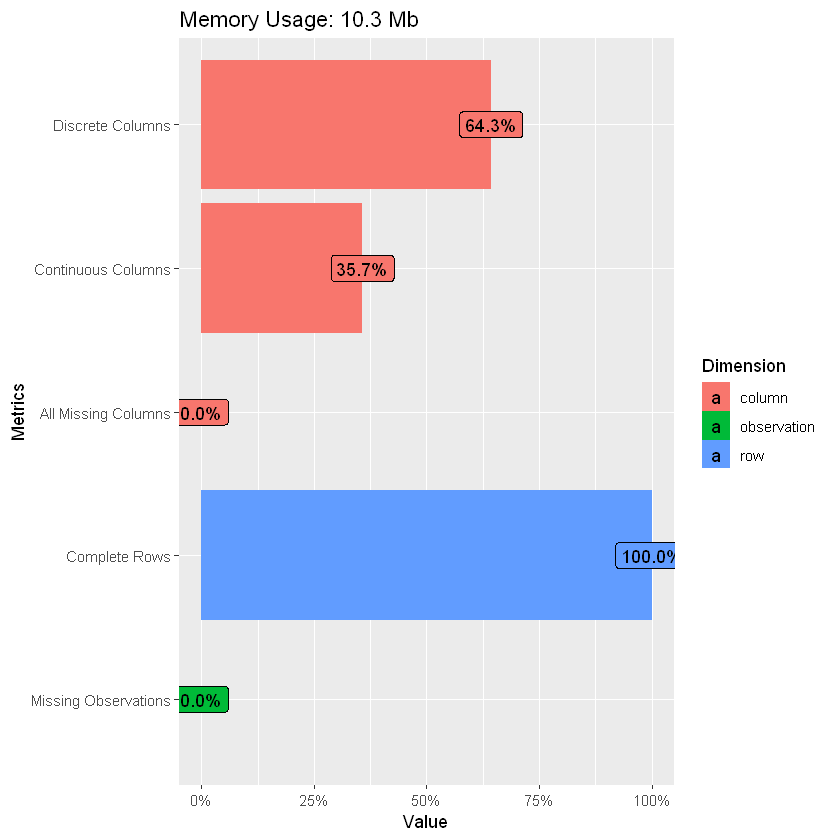

In [29]:
plot_intro(datosComprasEstatales2018)

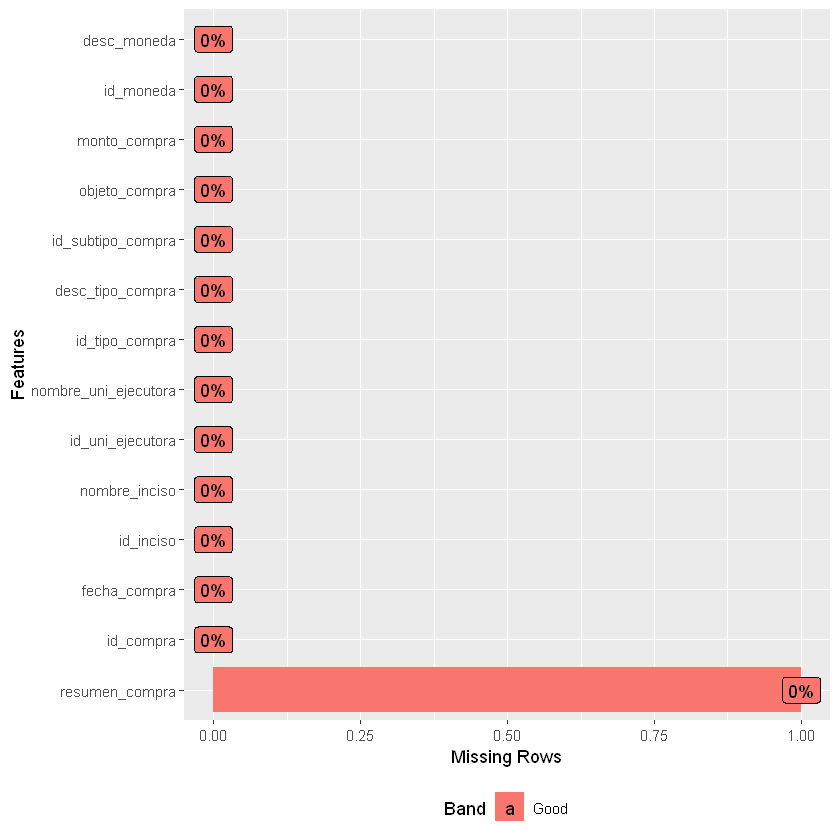

In [30]:
# Graficar porcentaje (%) de valores faltantes o nulos, por columna
plot_missing(datosComprasEstatales2018)

Claramente resulta extraño que no haya datos faltantes en las distintas variables y más aún habiendo hecho un estudio exploratorio previo e identificando algunos ruidos.
Es por ello que consideramos necesario interiorizarnos más en conocer la calidad de aquellos atributos que puedan afectar los resultados.

#### Variable: OBJETO_COMPRA
Es de relevancia realizar el estudio de esta variable dado que será objeto de consulta para identificar el fin de las compras y poder trabajar con insumos de mayor calidad para obtener resultados más fiables que nos permitan identificar algún patrón.

In [31]:
# Vamos a contar cantidad de valores "":
cantObjetoVacio <- datosComprasEstatales2018 %>% select(objeto_compra) %>% 
                            filter(objeto_compra == '') %>%  
                            count()
print(paste("Valores vacíos: ", cantObjetoVacio))

# Vamos a contar cantidad de valores que únicamente tienen "_" o ".". El motivo es a partir de la observación realizada con la
# función describe(), que indicaba como valores más bajos de esta variable una secuencia de guiones.
cantObjetoInvalido <- datosComprasEstatales2018 %>%
                             filter(objeto_compra == '-'|objeto_compra =='--'|objeto_compra =='---'|objeto_compra =='----')%>%  
                             count()
print(paste("Valores inválidos con guión: ", cantObjetoInvalido))

cantObjetoInvalido2 <- datosComprasEstatales2018 %>%
                             filter(objeto_compra == '.'|objeto_compra =='..'|objeto_compra =='...'|objeto_compra =='?'|objeto_compra =='!')%>%  
                             count()
print(paste("Valores inválidos con punto: ", cantObjetoInvalido2))

[1] "Valores vacíos:  12"
[1] "Valores inválidos con guión:  32"
[1] "Valores inválidos con punto:  20"


#### Reemplazo de los valores inválidos por NA
Si bien sabemos que los resultados inválidos que pudimos encontrar no representan una muestra significativa de todas maneras
quisimos reemplazarlo porque sería una técnica a seguir.

In [32]:
datosComprasEstatales2018$objeto_compra <- replace(datosComprasEstatales2018$objeto_compra, datosComprasEstatales2018$objeto_compra == '-'|datosComprasEstatales2018$objeto_compra =='--'|datosComprasEstatales2018$objeto_compra =='---'|datosComprasEstatales2018$objeto_compra =='----' |datosComprasEstatales2018$objeto_compra == '.'|datosComprasEstatales2018$objeto_compra =='..'|datosComprasEstatales2018$objeto_compra =='...'|datosComprasEstatales2018$objeto_compra =='?',NA)                         

profile_missing(datosComprasEstatales2018)

feature,num_missing,pct_missing
id_compra,0,0.000000e+00
fecha_compra,0,0.000000e+00
id_inciso,0,0.000000e+00
nombre_inciso,0,0.000000e+00
id_uni_ejecutora,0,0.000000e+00
nombre_uni_ejecutora,0,0.000000e+00
id_tipo_compra,0,0.000000e+00
desc_tipo_compra,0,0.000000e+00
id_subtipo_compra,0,0.000000e+00
resumen_compra,1,1.805934e-05


#### Variable: MONTO_COMPRA
Es de relevancia realizar el estudio de esta variable dado que será objeto de consulta para identificar los montos de las compras y poder hacer agregaciones por diversos factores.

In [33]:
# Vamos a contar cantidad de valores negativos:
cantMontoNegativo <- datosComprasEstatales2018 %>% select(monto_compra) %>% 
                            filter(monto_compra <0) %>%
                            count()
print(paste("Valores negativos: ", cantMontoNegativo))

# Nos pareció interesante conocer que tan altos eran los números negativos
datosComprasEstatales2018 %>% select(monto_compra) %>% 
                            filter(monto_compra <0) %>%
                            summary(min=min(monto_compra), media=mean(monto_compra), max= max(monto_compra))

[1] "Valores negativos:  19"


  monto_compra      
 Min.   :-13979202  
 1st Qu.:  -280425  
 Median :  -215000  
 Mean   :  -945058  
 3rd Qu.:   -71350  
 Max.   :    -2000  

In [34]:
# Vamos a contar cantidad de valores $0:
cantMontoCero <- datosComprasEstatales2018 %>% select(monto_compra) %>% 
                            filter(monto_compra == 0) %>%
                            count()
print(paste("Valores cero: ", cantMontoCero))

[1] "Valores cero:  2108"


In [35]:
# Vamos a contar cantidad de valores $436.000 por tratarse del máximo admitido por el T.O.C.A.F:
cantMontoAltos <- datosComprasEstatales2018 %>% select(monto_compra) %>% 
                            filter(monto_compra > 436000) %>%
                            count()
print(paste("Valores mayores: ", cantMontoAltos))

# Nos pareció interesante conocer que tan altos
datosComprasEstatales2018 %>% select(monto_compra) %>% 
                            filter(monto_compra > 436000) %>%
                            summary(min=min(monto_compra), media=mean(monto_compra), max= max(monto_compra))

[1] "Valores mayores:  2386"


  monto_compra      
 Min.   :4.367e+05  
 1st Qu.:7.916e+05  
 Median :1.398e+06  
 Mean   :1.580e+08  
 3rd Qu.:3.521e+06  
 Max.   :3.687e+11  

En base al resultado anterior se investiga un poco más respecto a estos montos debido a que algunos son realmente altos lo que puede indicar algún tipo de error o irregularidad. 
Consultado por tipo de cuenta y tipo de moneda.

In [36]:
# Realizamos una descripción por tipo de compra y tipo moneda
datosComprasEstatales2018 %>% filter(monto_compra > 436000) %>%
                              group_by(desc_tipo_compra,desc_moneda) %>%
                              summarise(min=min(monto_compra), media=mean(monto_compra), max= max(monto_compra))                              

desc_tipo_compra,desc_moneda,min,media,max
Compra Directa,PESOS URUGUAYOS,438065.7,1046467.9,1.185840e+07
Compra por Excepción,DLS.USA BILLETE,51010725.0,51010725.0,5.101073e+07
Compra por Excepción,DOLAR PIZARRA COMPRADOR,547543.3,547543.3,5.475433e+05
Compra por Excepción,DOLAR PIZARRA VENDEDOR,460346.9,1226047.3,9.975912e+06
Compra por Excepción,EURO,612000.0,612000.0,6.120000e+05
Compra por Excepción,PESOS URUGUAYOS,436998.7,453755589.6,3.687384e+11
Compra por Excepción,UNIDAD INDEXADA,3780000.0,3780000.0,3.780000e+06
Licitación Abreviada,DOLAR INTERBANCARIO COMPRADOR,442738.0,487239.0,5.317400e+05
Licitación Abreviada,PESOS URUGUAYOS,436707.5,2696760.6,4.000000e+07
Licitación Abreviada,UNIDAD INDEXADA,498443.7,498443.7,4.984437e+05


In [37]:
# Realizamos una descripción por unidad organizativa
datosComprasEstatales2018 %>% filter(monto_compra > 436000,desc_moneda=="PESOS URUGUAYOS") %>%
                              group_by(nombre_uni_ejecutora,desc_tipo_compra) %>%
                              summarise(min=min(monto_compra), media=mean(monto_compra), max= max(monto_compra)) %>%
                              arrange(-max)

cantComprasIrregulares <- datosComprasEstatales2018 %>% filter(monto_compra > 436000,desc_moneda=="PESOS URUGUAYOS") %>%
                              group_by(nombre_uni_ejecutora,desc_tipo_compra) %>%
                              summarise(min=min(monto_compra), media=mean(monto_compra), max= max(monto_compra)) %>%
                              arrange(-max)

#count(cantComprasIrregulares) #Cantidad de compras por unidad ejecutora y tipo de compra

nombre_uni_ejecutora,desc_tipo_compra,min,media,max
Consejo de Educación Técnico-Profesional,Compra por Excepción,442347.6,17560065589,368738393981
Presidencia de la República,Compra por Excepción,492776.3,13326584,139637540
Consejo Directivo Central,Licitación Pública,935008.0,30707539,104198119
Intendencia de Maldonado,Licitación Pública,12222799.8,52122674,92022549
Intendencia de Maldonado,PFI - Licitación pública internacional,48445170.6,68672899,88900627
Secretaría del Ministerio del Interior,Compra por Excepción,447008.0,6709162,65883603
Intendencia de Río Negro,Licitación Pública,51741143.4,51741143,51741143
Banco de Seguros del Estado,Licitación Pública,50632897.6,50632898,50632898
Ex-Adm.Gral- Dir. General Secret.,Compra por Excepción,572500.0,4989179,49702258
Consejo de Educación Primaria,Licitación Pública,510136.9,15172476,44161341


In [38]:
# Gastos por inciso 
datosComprasEstatales2018 %>% filter(monto_compra>0) %>%
                              group_by(nombre_inciso, desc_moneda) %>%
                              summarise(min=min(monto_compra), media=mean(monto_compra), max= max(monto_compra)) %>%
                              arrange(-max)

nombre_inciso,desc_moneda,min,media,max
Administración Nacional de Educación Pública,PESOS URUGUAYOS,1.22,188836281.55,368738393981
Diversos Créditos,PESOS URUGUAYOS,300.00,1331186.66,139637540
Intendencia de Maldonado,PESOS URUGUAYOS,1.00,10216571.96,92022549
Ministerio del Interior,PESOS URUGUAYOS,176.00,99766.45,65883603
Intendencia de Río Negro,PESOS URUGUAYOS,973511.20,12476242.43,51741143
Banco Central del Uruguay,DLS.USA BILLETE,15000.00,8542149.58,51010725
Banco de Seguros del Estado,PESOS URUGUAYOS,574717.60,13409867.45,50632898
Ministerio de Desarrollo Social,PESOS URUGUAYOS,590.00,929577.07,49702258
Ministerio de Defensa Nacional,PESOS URUGUAYOS,622.20,402449.92,43513578
Instituto Uruguayo de Meteorología,PESOS URUGUAYOS,1000.00,343053.94,41000000


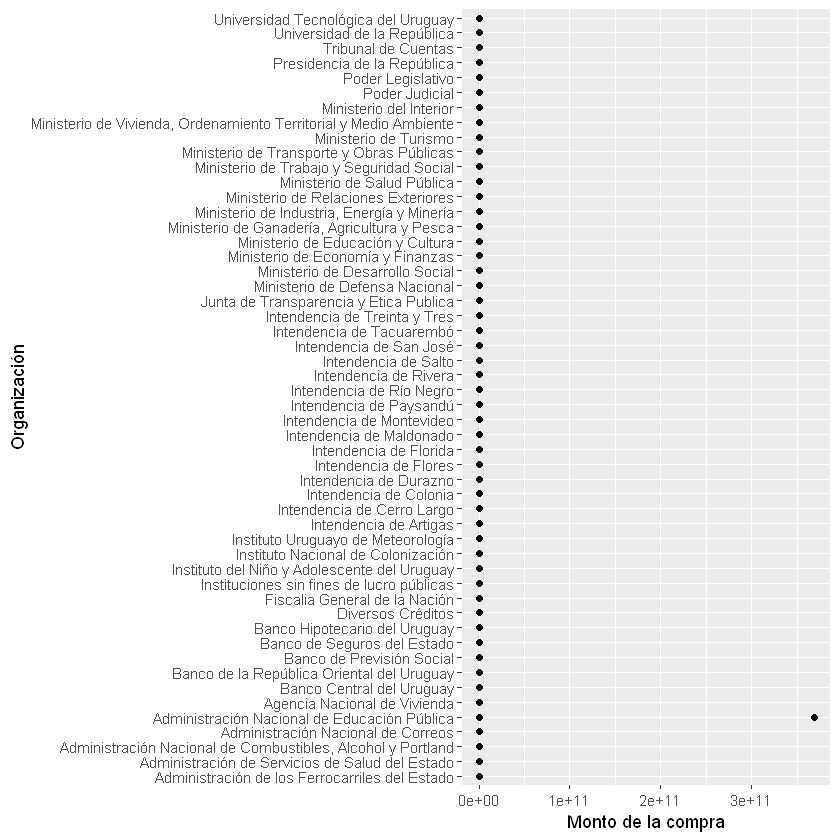

In [130]:
qplot(datosComprasEstatales2018$monto_compra,datosComprasEstatales2018$nombre_inciso, data = datosComprasEstatales2018)+
      labs(y="Organización", x="Monto de la compra")

In [40]:
# Conocemos el resumen de la compra que excede ampliamente las demás
datosComprasEstatales2018 %>% select(fecha_compra,nombre_inciso, nombre_uni_ejecutora, desc_tipo_compra, objeto_compra, monto_compra,desc_moneda) %>%
                              filter(monto_compra == max(monto_compra))

fecha_compra,nombre_inciso,nombre_uni_ejecutora,desc_tipo_compra,objeto_compra,monto_compra,desc_moneda
23/10/2018,Administración Nacional de Educación Pública,Consejo de Educación Técnico-Profesional,Compra por Excepción,Adecuación de laboratorios en Ercna Carmelo.,368738393981,PESOS URUGUAYOS


#### Continuación análisis Variable: OBJETO_COMPRA 
Es de relevancia realizar el estudio de esta variable dado que será objeto de consulta para agrupar los motivos de compra.

In [47]:
# Cantidad de compras por objeto_compra
datosComprasEstatales2018 %>% filter(!is.na(objeto_compra)) %>%
                              group_by(objeto_compra) %>%
                              summarise(sum(monto_compra), cantidad=n()) %>%
                              arrange(desc(cantidad))

# Filtra por coincidencia de los valores que le pasamos que son las mayores agrupaciones
cantCoincidencias <- datosComprasEstatales2018 %>%
                              filter(!is.na(objeto_compra),str_detect(objeto_compra, 'FERRETERIA|MEDICAMENTO')) %>%
                              count()

print(paste("Cantidad de objetos por coincidencia de FERRETERIA / MEDICAMENTOS: ", cantCoincidencias))

objeto_compra,sum(monto_compra),cantidad
FERRETERIA,2281620.3,402
COMPRA DE MEDICAMENTO ABIRATERONA,6644305.8,273
COMPRA DE MEDICAMENTO FINGOLIMOD,16028145.0,266
COMPRA DE MEDICAMENTO LENALIDOMIDA,23168654.7,185
COMPRA DE MEDICAMENTO PIRFENIDONA,9350806.2,123
COMPRA DE MEDICAMENTO OMALIZUMAB,18580988.4,110
COMPRA DE MEDICAMENTO IBRUTINIB,24285485.6,107
COMPRA DE MEDICAMENTO CETUXIMAB,24342738.5,106
Repuestos varios para la flota automotríz.,622091.8,104
Pasajes,2257188.1,100


[1] "Cantidad de objetos por coincidencia de FERRETERIA / MEDICAMENTOS:  3175"


objeto_compra,cantidad
FERRETERIA,402
COMPRA DE MEDICAMENTO ABIRATERONA,273
COMPRA DE MEDICAMENTO FINGOLIMOD,266
COMPRA DE MEDICAMENTO LENALIDOMIDA,185
COMPRA DE MEDICAMENTO PIRFENIDONA,123
COMPRA DE MEDICAMENTO OMALIZUMAB,110
COMPRA DE MEDICAMENTO IBRUTINIB,107
COMPRA DE MEDICAMENTO CETUXIMAB,106
Repuestos varios para la flota automotríz.,104
Pasajes,100


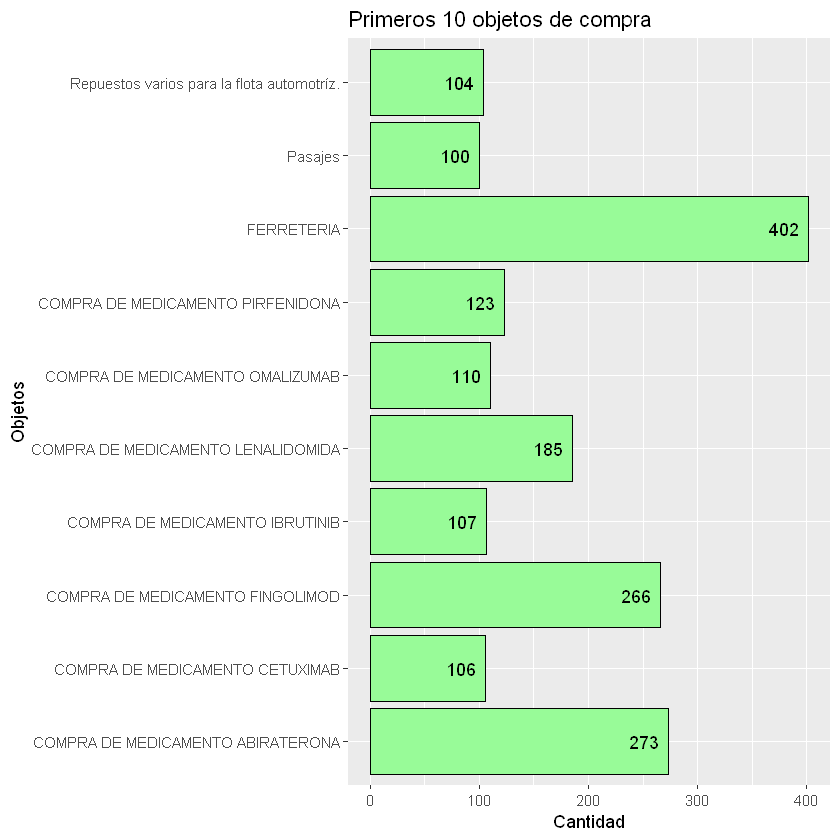

In [55]:
# Primeros 10 objetos_compra que más aparecen
top10 <- datosComprasEstatales2018 %>% filter(!is.na(objeto_compra)) %>%
                              group_by(objeto_compra) %>%
                              summarise(cantidad=n()) %>%
                              arrange(desc(cantidad))
primeros <- top10[1:10, ]
primeros

# Graficamos los 10 primeros objetos de compra
primeros <- top10[1:10, ] # Mostrar los primeros 10 valores
primeros %>%
  ggplot(aes(primeros$objeto_compra, primeros$cantidad)) +
  geom_bar(stat = "identity", color = "black", fill = "palegreen") +
  geom_text(aes(hjust = 1.3, label = primeros$cantidad)) + 
  coord_flip() + 
  labs(title = "Primeros 10 objetos de compra",  x = "Objetos", y = "Cantidad")

#### CONSIDERACIONES:

A partir de esta verificación de los datos el equipo decide no utilizar los montos de compra negativos, ni iguales a $0 y quitar el monto correspondiente a la compra anteriormente desplegada, dado que entendemos que pueden alterar al análisis e incluso pueden tratarse de valores erróneos, pero no se quieren quitar del data set porque tienen una razón de ser para el negocio.
De todas maneras estos datos se identificaron y van a ser presentados al cliente por si desea hacer algún análisis particular e indagar más en ellos.

En cuanto al objeto de compra en una etapa posterior se realizarán transformaciones como pasar todos los valores a mayúscula y quitan blancos al principio y final con el objetivo de poder realizar alguna coincidencia que permita agrupar, de todas maneras se observa que los valores son muy dispares por lo que será muy dificil obtener una muestra significativa, habría que buscar otra estrategia de clasificación pero esto dependerá del negocio dado que actualmente no contamos con datos que nos permitan filtrar a un buen nivel.

#### Reemplazo de los valores vacíos por NA
Generalizamos el reemplazo de todos los valores vacíos encontrados dentro del dataset por NA.

In [42]:
# Remplazo valores string vacío por NA utilizando mutate_all
datosComprasEstatales2018 <- mutate_all(datosComprasEstatales2018, funs(na_if(.,"")))
profile_missing(datosComprasEstatales2018)

Warning message:
"funs() is soft deprecated as of dplyr 0.8.0
please use list() instead

# Before:
funs(name = f(.)

# After: 
list(name = ~f(.))
This warning is displayed once per session."

feature,num_missing,pct_missing
id_compra,0,0.000000e+00
fecha_compra,0,0.000000e+00
id_inciso,0,0.000000e+00
nombre_inciso,0,0.000000e+00
id_uni_ejecutora,0,0.000000e+00
nombre_uni_ejecutora,0,0.000000e+00
id_tipo_compra,0,0.000000e+00
desc_tipo_compra,0,0.000000e+00
id_subtipo_compra,0,0.000000e+00
resumen_compra,1,1.805934e-05


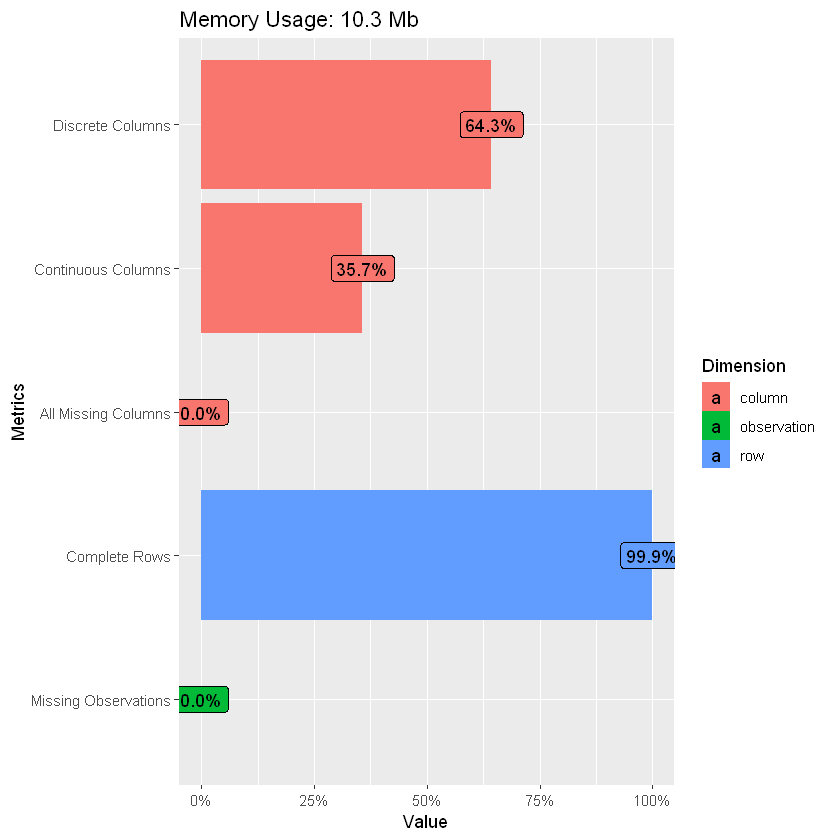

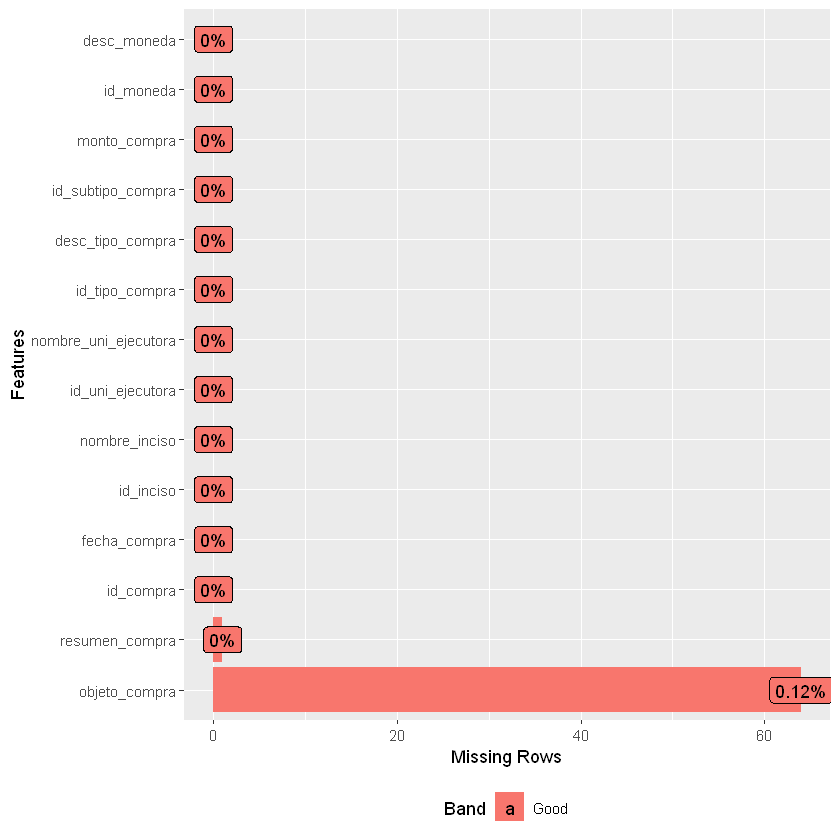

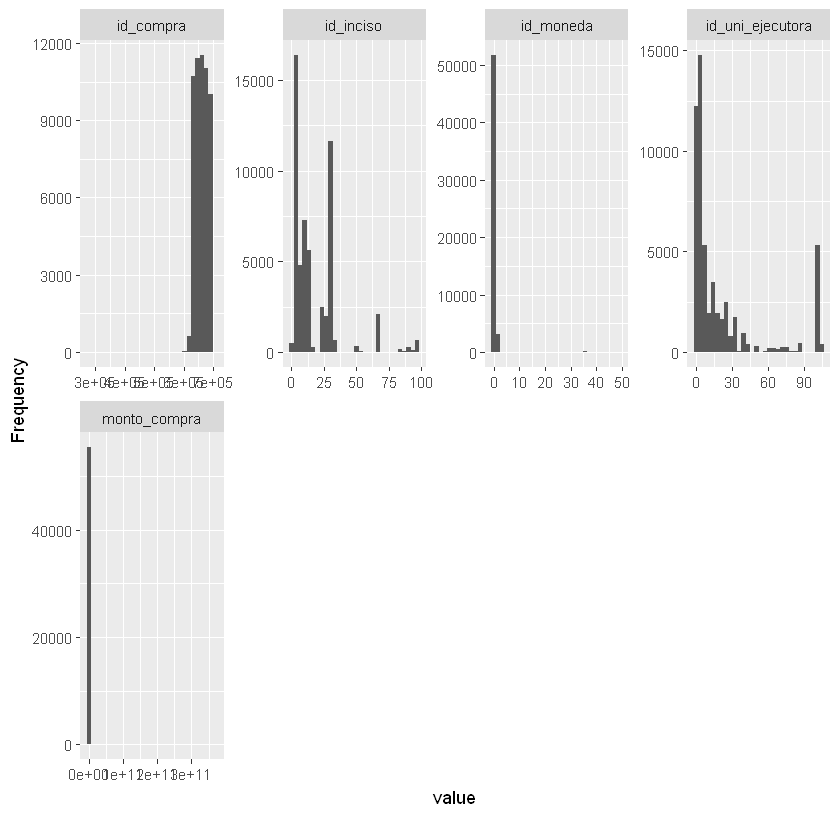

In [43]:
plot_intro(datosComprasEstatales2018)
# Graficar porcentaje (%) de valores faltantes o nulos, por columna luego de la pequeña transformación
plot_missing(datosComprasEstatales2018)
# Histogramas de las variables continuas
plot_histogram(datosComprasEstatales2018)

Desde un inicio se supuso que los id asociados a las tablas codigueras eran válidos de todas maneras se verificó la existencia de una referencia correcta desde el data set base a la codiguera asociada. Esta hipótesis se confirmó cuando realizamos el merge entre los distintos data frame.

In [44]:
# ALGUNAS EXPLORACIONES QUE SE HICIERON SOBRE LOS DATOS
datosComprasEstatales2018 %>% group_by(nombre_uni_ejecutora) %>% 
                              summarise(cant_compras=n())%>% 
                              arrange(desc(cant_compras))

datosComprasEstatales2018 %>% group_by(nombre_inciso,nombre_uni_ejecutora) %>% 
                              summarise(cant_compras=n()) %>% 
                              arrange(nombre_inciso)

intendenciaColonia <- filter(datosComprasEstatales2018, nombre_inciso=="Intendencia de Colonia")


cantCompras <- count(intendenciaColonia)
print(paste("La IMC compró: ", cantCompras))
arrange(intendenciaColonia,-monto_compra)
sumaTotal <- sum(intendenciaColonia$monto_compra) # No discrimina por moneda

print("Gastos discriminados por moneda de la IMC: ")
intendenciaColonia %>% group_by(desc_moneda) %>% 
                       summarise(sum(monto_compra))

# Filtra por coincidencia de los valores que le pasamos
datosComprasEstatales2018 %>%
        filter(str_detect(objeto_compra, 'FERRETERIA|MEDICAMENTOS')) %>%
        count()


nombre_uni_ejecutora,cant_compras
Dirección General de la Salud,3945
Dirección General de Secretaría,2769
Hospital Maciel,2538
Adminstración Nacional de Correos,2105
Dirección Nacional de Arquitectura,1382
Dirección General de Servicios Ganaderos,1141
Centro Departamental de Rocha,1116
Consejo de Educación Primaria,1098
Secretaría del Ministerio del Interior,1003
Dirección Nacional de Cultura,933


nombre_inciso,nombre_uni_ejecutora,cant_compras
Administración de los Ferrocarriles del Estado,Administración de los Ferrocarriles del Estado,5
Administración de Servicios de Salud del Estado,Administración de Servicios de Salud del Estado,167
Administración de Servicios de Salud del Estado,Asistencia Integral,78
Administración de Servicios de Salud del Estado,Atencion de Urgencia Emergencia Prehospitalaria y Traslado.,10
Administración de Servicios de Salud del Estado,Centro Aux. de Cardona y Florencio Sánchez,3
Administración de Servicios de Salud del Estado,Centro Auxiliar Chuy,259
Administración de Servicios de Salud del Estado,Centro Auxiliar de Bella Unión,170
Administración de Servicios de Salud del Estado,Centro Auxiliar de Carmelo,9
Administración de Servicios de Salud del Estado,Centro Auxiliar de Dolores,23
Administración de Servicios de Salud del Estado,Centro Auxiliar de Juan Lacaze,13


[1] "La IMC compró:  113"


id_compra,fecha_compra,id_inciso,nombre_inciso,id_uni_ejecutora,nombre_uni_ejecutora,id_tipo_compra,desc_tipo_compra,id_subtipo_compra,resumen_compra,objeto_compra,monto_compra,id_moneda,desc_moneda
624357,05/03/2018,83,Intendencia de Colonia,1,Intendencia de Colonia,LP,Licitación Pública,COM,Común,REMODELACION DE CALLE ATANASIO SIERRA DE COLONIA,15992864,0,PESOS URUGUAYOS
674382,23/10/2018,83,Intendencia de Colonia,1,Intendencia de Colonia,LA,Licitación Abreviada,COM,Común,ALCANTARILLAS DE HORMIGÓN ARMADO EN ZONA ESTE DEL DEPARTAMENTO,6958880,0,PESOS URUGUAYOS
649437,02/07/2018,83,Intendencia de Colonia,1,Intendencia de Colonia,LA,Licitación Abreviada,COM,Común,"""SUMINISTRO DE CAÑOS EN VARIOS CABEZALES, EN HORMIGÓN Y HORMIGÓN ARMADO""",6915838,0,PESOS URUGUAYOS
624100,18/01/2018,83,Intendencia de Colonia,1,Intendencia de Colonia,LA,Licitación Abreviada,COM,Común,BACHEO EN CALLES DE LOCALIDADES DE LA ZONA ESTE DEL DEPARTAMENTO,5597360,0,PESOS URUGUAYOS
633559,30/04/2018,83,Intendencia de Colonia,1,Intendencia de Colonia,LA,Licitación Abreviada,COM,Común,"CONSTRUCCIÓN DE VEREDAS, RAMPAS, ETC, EN DISTINTAS LOCALIDADES DEL DEPARTAMENTO",5249572,0,PESOS URUGUAYOS
662693,17/09/2018,83,Intendencia de Colonia,1,Intendencia de Colonia,LA,Licitación Abreviada,COM,Común,"""TRATAMIENTOS ASFÁLTICOS EN NUEVA PALMIRA""",5052020,0,PESOS URUGUAYOS
660911,17/09/2018,83,Intendencia de Colonia,1,Intendencia de Colonia,LA,Licitación Abreviada,COM,Común,RECONSTRUCCIÓN DE PAVIMENTOS ASFÁLTICOS EN ZONA OESTE DEL DEPARTAMENTO,5004593,0,PESOS URUGUAYOS
671637,01/11/2018,83,Intendencia de Colonia,1,Intendencia de Colonia,LA,Licitación Abreviada,COM,Común,"""TRATAMIENTOS ASFALTICOS EN LOCALIDADES DE ZONA ESTE DEL DEPARTAMENTO""",4617395,0,PESOS URUGUAYOS
650999,01/06/2018,83,Intendencia de Colonia,1,Intendencia de Colonia,LA,Licitación Abreviada,COM,Común,"""BACHEO EN CALLES DE LOCALIDADES DE LA ZONA CENTRO-ESTE DEL DEPARTAMENTO""",3696600,0,PESOS URUGUAYOS
644672,04/05/2018,83,Intendencia de Colonia,1,Intendencia de Colonia,LA,Licitación Abreviada,COM,Común,"""ARRENDAMIENTO DE 2 (DOS) CILINDROS COMPACTADORES PARA TRABAJOS EN DISTINTAS LOCALIDADES DEL DEPARTAMENTO""",2374120,0,PESOS URUGUAYOS


[1] "Gastos discriminados por moneda de la IMC: "


desc_moneda,sum(monto_compra)
DOLAR INTERBANCARIO VENDEDOR,712670.9
PESOS URUGUAYOS,109140963.5


n
571


#### Comentarios:

A partir del primer acercamiento con los datos comenzamos a identificar algunos problemas o desafios como:

* Comprensión de algunos aspectos que nos solicita el cliente como el monto $ 436.000.
Trás investigar vimos que de acuerdo al T.O.C.A.F dicho valor corresponde al monto limite para la compra directa común (categoría a) de las adquisiciones estatales reguladas según el Decreto 150/012 en el período Ene-Dic 2018.
* Datos solicitados como "tipo de Objeto" que se adquiere en la compra, no resultan tan claros de identificar en el data set. Por lo que las propias fuentes de datos cuentan con limitantes.
* Desconocimiento de la regulación y términos referidos a compras estatales. Se requiere de una persona que entienda del negocio para evacuar dudas.
* La calidad de los datos en alguna variable puede complicar los resultados obtenidos en los análisis, incluso dificultar la comprensión de los datos.
* Se identifican atributos sobre los cuáles trabajar y cuáles descartar para cumplir con los requerimientos del negocio.


## ENTENDIMIENTO DE LOS DATOS

A partir de la ingesta y exploración inicial de los datos definimos una serie de supuestos y atributos sobre los cuáles vamos a basar nuestros análisis para poder llegar a resultados que solucionen los requerimientos de negocio.

En la etapa de **_adquisión de datos_** se hizo una lectura superficial para comprender los datos con los que contamos para evaluar la calidad de los mismos e identificar posibles riesgos, falta de información e incluso ver alertas sobre las cuales se pueda continuar indagando y obtener resultados interesantes.

Aplicando la función **_summary()_** obtuvimos un resumen de información orientativa respecto a cada variable dependiendo de su tipo (numérica o categórica). De esto el equipo plantea las siguientes hipotésis para orientar los análisis y obtener los resultados deseados.

#### ASPECTOS IDENTIFICADOS A TRABAJAR Y RIESGOS

* Un gran número de compras dentro de cada data set corresponden a compras del tipo: _"Compra directa"_

* Falta de calidad de los datos en la variable _ monto_adj_ correspondiente al monto adjudicado a la compra. En este punto se identifican distintos formatos que consideramos inválidos: valores negativos, valores que superan el máximo regulado por T.O.C.A.F, valores cero y puntualmente en el caso del data set asociado a las compras del segundo semestre todos los montos reflejan cifras exponencialmente pequeñas o muy grandes.

* Se detecta una importante carencia de calidad en los datos de la variable _objeto_. Desde falta de criterio en el ingreso, falta del dato o falta de consistencia. Y consideramos que es una variable esencial para la calidad del resultado de muchos análisis. Dentro de los datos coincidentes encontramos que los objetos _FERRETERÍA_ y _COMPRA DE MEDICAMENTOS_ eran los más recurrentes en ambos data set, pero debemos conciderar que no representa una muestra significativa ya que más de 27000 registros por data set presentar datos que requieren de su limpieza y procesamiento para ser utilizados.

#### MANEJO DE DATOS Y CONSIDERACIONES PARA RESOLVER LOS REQUERIMIENTOS DEL NEGOCIO

* Tras los aspectos analizados en el punto anterior en sumatoria a lo solicitado por el cliente se considera necesario trabajar en la calidad y validez de los datos almacenados en las variables: **_ monto_adj_** y **_objeto_** dado que implican un alto riesgo para los resultados.

Para el caso del *monto adjudicado para la compra* desde el negocio se plantean investigar aquellas compras que tengan montos vacíos y nulos, desde nuestra perspectiva consideramos interesante además agregar los valores negativos, o que superen el monto máximo establecido por la unidad reguladora ya que los consideramos como inválidos, entre ellos los exponencialmente altos.

HIPOTESIS: 
Se va a estudiar la relación de los montos inválidos respecto al tipo de moneda para detectar irregularidades en la normativa establecida por el T.O.C.A.F

* **¿En qué se gasta el dinero?**
No encontramos una descripción de tipo de objeto o producto, el dato con el que se cuenta es el **_objeto_** y no es una columna que se encuentre muy limpia, no tiene un criterio en su contenido por lo que intentaremos basar la búsqueda en coincidencias de texto. A su vez también no interesa saber aquellas compras que no tienen un objeto asociado.

HIPOTESIS: 
Lo primero es realizar una limpieza y filtrado de datos en busca de coincidencias.
Se va a estudiar la relación de las compras por objeto asociado con los montos de la compra y las unidades ejecutoras relacionadas para determinar en que objeto se gasta el dinero.
Vamos a estudiar la relación sobre en qué objeto se realizan más compras.
Se va a estudiar la relación de las compras que no tienen objeto asociado con los montos de compra.

* **Organizaciones que gastaron más dinero**
Necesitamos conocer las unidades ejecutoras **_ id_ue_** junto con el monto de la compra **_ monto_adj_** y conocer la moneda en que se realizó la compra para poder comparar **_ id_moneda_monto_adj_**

HIPOTESIS: 
Para la resolución se filtrarán las compras por unidad ejecutora en relación a la moneda de compra y el monto haciendo un rancking de los que más gastaron.
Se va a considerar para realizar el rancking las compras realizadas en la moneda más frecuente ya que entendemos que va a ser el resultado más representativo.
Se va a estudiar la relación de las unidades ejecutoras que más dinero gastaron en relación al inciso al que pertenecen.

* **Conocer las compras de mayor dinero**
Para ello se utilizará la variable monto de la compra **_ monto_adj_** y al igual que en el caso anterior se filtrará por el 
**_ id_moneda_monto_adj_** para poder realizar el ranking.

HIPOTESIS:
Resulta interesante además conocer si dichas compras superan los montos máximos establecidos por el T.O.C.A.F para ver irregularidades.

* **Agregación del monto total por tipo de producto**
No encontramos una descripción de tipo de producto, el dato con el que se cuenta es el **_ objeto_** y no es una columna que se encuentre muy limpia, no tiene un criterio en su contenido por lo que intentaremos basar la búsqueda en coincidencias de texto. 

* **Unidades ejecutoras que más compraron**
Necesitamos agrupar por unidades ejecutoras **_ id_ue_** las compras efectuadas en el período 2018.

* **¿Compras directas que superen los "$ 436.000"?**
Aquí lo que se pretende es obtener las compras directas que incumplan con el monto máximo establecido por el T.O.C.A.F. Para ello necesitamos el **_ monto_adj_**, a su vez conocer el **_ id_tipocompra_** dado que nos interesan puntualmente las compras directas y **_ id_moneda_monto_adj_** debido a que tenemos que considerar el peso uruguayo como moneda. Para estos casos donde tenemos claves foráneas a las codigueras debemos asociar el dato con las compras.

A su vez asumimos que todo lo que supere el monto de "$ 436.000" en pesos uruguayos se considera irregular


### CALIDAD DE DATOS: VALIDACIÓN Y LIMPIEZA

Como se mencionó anteriormente en el caso del **_ monto_compra_** no se van a quitar los valores que a nuestro entender no aportan a los resultados (o pueden significar errores de ingreso) sino que se van a filtrar al momento del análisis.

En cuanto al **_objeto_** dada la gran variabilidad de datos que se observaron y las pocas posibilidades de agrupamiento se intenta realizar algunas transformaciones para mejorar la calidad de los datos. Pero esta es una limitante con la que se cuenta, si se desea un análisis más preciso se deberá indagar por parte del negocio la manera de obtener un dato más preciso.

#### TRANSFORMACIONES

In [62]:
# Aplicamos las transformaciones de: PASAR TODO A MAYÚSCULA, QUITAR ESPACIOS EXTRAS EN BLANCO Y QUITAR TÍLDES
# Si bien existen otras opciones el objeto_compra es un campo de libre ingreso por lo tanto el realizar algún otro tipo 
# de filtrado como de caracteres especiales podemos sesgar y dejar fuera resultados que nos interesarían analizar.
datosComprasEstatales2018$objeto_compra <- str_trim(datosComprasEstatales2018$objeto_compra, side = "both")
datosComprasEstatales2018$objeto_compra <- str_to_upper(datosComprasEstatales2018$objeto_compra, locale = "es")
datosComprasEstatales2018$objeto_compra <- chartr('ÁÉÍÓÚÑ','AEIOUN',datosComprasEstatales2018$objeto_compra)

datosComprasEstatales2018[1:5,]
str(datosComprasEstatales2018)

id_compra,fecha_compra,id_inciso,nombre_inciso,id_uni_ejecutora,nombre_uni_ejecutora,id_tipo_compra,desc_tipo_compra,id_subtipo_compra,resumen_compra,objeto_compra,monto_compra,id_moneda,desc_moneda
660228,20/04/2018,1,Poder Legislativo,1,Cámara de Senadores,CD,Compra Directa,COM,Común,MEMORIA DDR3,1512.80,0,PESOS URUGUAYOS
652405,28/02/2018,1,Poder Legislativo,1,Cámara de Senadores,CD,Compra Directa,COM,Común,APRIETAPAPELES DE 41 MM,1130.06,0,PESOS URUGUAYOS
638806,03/01/2018,1,Poder Legislativo,1,Cámara de Senadores,CD,Compra Directa,COM,Común,SILLA MODELO SYNCRON VEGAS.,10604.76,0,PESOS URUGUAYOS
669911,04/06/2018,1,Poder Legislativo,1,Cámara de Senadores,CD,Compra Directa,COM,Común,VISITA TECNICA A MULTIFUNCION.,1159.00,0,PESOS URUGUAYOS
629307,06/10/2017,1,Poder Legislativo,1,Cámara de Senadores,CD,Compra Directa,COM,Común,MANTENIMIENTO AIRE ACONDICIONADO.,0.00,0,PESOS URUGUAYOS


'data.frame':	55373 obs. of  14 variables:
 $ id_compra           : int  660228 652405 638806 669911 629307 683363 651948 639920 677577 683594 ...
 $ fecha_compra        : Factor w/ 538 levels "01/01/2018","01/02/2017",..: 233 325 24 39 68 534 24 203 107 534 ...
 $ id_inciso           : int  1 1 1 1 1 1 1 1 1 1 ...
 $ nombre_inciso       : chr  "Poder Legislativo" "Poder Legislativo" "Poder Legislativo" "Poder Legislativo" ...
 $ id_uni_ejecutora    : int  1 1 1 1 1 1 1 1 1 1 ...
 $ nombre_uni_ejecutora: chr  "Cámara de Senadores" "Cámara de Senadores" "Cámara de Senadores" "Cámara de Senadores" ...
 $ id_tipo_compra      : Factor w/ 15 levels "CD","CE","CO",..: 1 1 1 1 1 1 1 1 1 1 ...
 $ desc_tipo_compra    : chr  "Compra Directa" "Compra Directa" "Compra Directa" "Compra Directa" ...
 $ id_subtipo_compra   : Factor w/ 37 levels "33-1","33-10",..: 30 30 30 30 30 30 30 30 30 30 ...
 $ resumen_compra      : chr  "Común" "Común" "Común" "Común" ...
 $ objeto_compra       : chr  "MEMORIA 

In [77]:
# Cantidad de compras por objeto_compra

datosComprasEstatales2018 %>% filter(!is.na(objeto_compra)) %>%
                              group_by(objeto_compra) %>%
                              summarise(cantidad=n()) %>%
                              arrange(desc(cantidad)) %>%
                              filter(cantidad > 50)


# Filtra por coincidencia de los valores que le pasamos que son las mayores agrupaciones (SE SELECCIONAN 10 PALABRAS)
cantCoincidencias <- datosComprasEstatales2018 %>%
                              filter(!is.na(objeto_compra),str_detect(objeto_compra, 'FERRETERIA|MEDICAMENTO|PASAJE|ESTUDIO|LIMPIEZA|PUBLICACION|MANTENIMIENTO|VEHICULO|REPUESTO|REPARACION')) %>%
                              count()

print(paste("Cantidad de objetos por coincidencia: ", cantCoincidencias))

objeto_compra,cantidad
FERRETERIA,406
COMPRA DE MEDICAMENTO,401
COMPRA DE MEDICAMENTO FINGOLIMOD,321
COMPRA DE MEDICAMENTO ABIRATERONA,316
COMPRA DE MEDICAMENTO LENALIDOMIDA,228
PASAJES,174
COMPRA DE MEDICAMENTO PIRFENIDONA,154
COMPRA DE MEDICAMENTO CETUXIMAB,134
COMPRA DE MEDICAMENTO IBRUTINIB,134
COMPRA DE MEDICAMENTO OMALIZUMAB,133


[1] "Cantidad de objetos por coincidencia:  16010"


In [78]:
# Considerando que el vector tiene 53373 filas que son descripciones no palabras se dificulta encontrar la frecuencia de una
# palabra es por ello que vamos a agrupar y buscar los más encontrados como se hizo en un inicio, para esto se considera la selección
# de palabras que aparece anteriormente
objetosFrecuentes <- datosComprasEstatales2018 %>%
                              filter(!is.na(objeto_compra),str_detect(objeto_compra, 'FERRETERIA|MEDICAMENTO|PASAJE|ESTUDIO|LIMPIEZA|PUBLICACION|MANTENIMIENTO|VEHICULO|REPUESTO|REPARACION'))

# Cargamos los datos como Corupus de la libreria tm
tipo_objeto = Corpus(VectorSource(objetosFrecuentes$objeto_compra)) 
inspect(tipo_objeto)

<<SimpleCorpus>>
Metadata:  corpus specific: 1, document level (indexed): 0
Content:  documents: 16010

    [1] MANTENIMIENTO AIRE ACONDICIONADO.                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                             
    [2] SERVICIO DE MANTENIMIENTO DE RELOJ EN SALA DE SESIONES                                                                                                                                                                                                                           

In [96]:
dtm <- TermDocumentMatrix(tipo_objeto)
m <- as.matrix(dtm)
v <- sort(rowSums(m),decreasing=TRUE)
d <- data.frame(word = names(v),freq=v)

head(d, 10)

# Más depuración dado que aún aparecen palabras que no aportan
tipos_depurados <- removeWords(objetosFrecuentes$objeto_compra, words = c("PARA", "DEL", "TAL", "TAN", "ASI", "POR", "COMO", "SINO", "ENTONCES", "EN", "DE", "LOS", "CON"))
tipo_objeto2 = Corpus(VectorSource(tipos_depurados)) 

dtm <- TermDocumentMatrix(tipo_objeto2)
m <- as.matrix(dtm)
v <- sort(rowSums(m),decreasing=TRUE)
d <- data.frame(word = names(v),freq=v)

head(d, 10)

,word,freq
compra,compra,3416
medicamento,medicamento,3382
reparacion,reparacion,3254
mantenimiento,mantenimiento,2872
para,para,2317
del,del,1355
repuestos,repuestos,1233
servicio,servicio,1178
por,por,1020
limpieza,limpieza,964


,word,freq
compra,compra,3416
medicamento,medicamento,3382
reparacion,reparacion,3254
mantenimiento,mantenimiento,2872
repuestos,repuestos,1233
servicio,servicio,1178
limpieza,limpieza,964
adquisicion,adquisicion,867
pasajes,pasajes,792
vehiculos,vehiculos,767


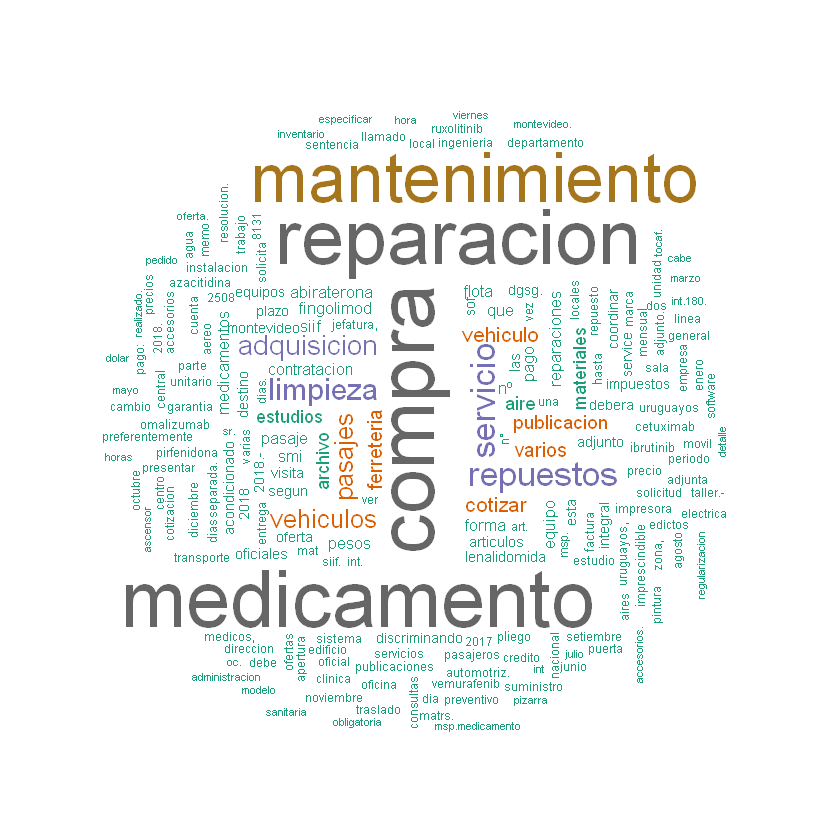

In [95]:
# Visualizacion de palabras
set.seed(1234)
wordcloud(words = d$word, freq = d$freq, min.freq = 1,
          max.words=200, random.order=FALSE, rot.per=0.35, 
          colors=brewer.pal(8, "Dark2"))

### ANÁLISIS SOBRE LOS DATOS

#### TOP 20 DE LAS ORGANIZACIONES QUE GASTARON MÁS DINERO

In [141]:
# Se deja fuera de los monto_compra negativos, iguales a cero y se quita el máximo valor observado por entenderse que no 
# son representativos. Su análisis y justificación se encuentra detallada anteriormente.

# Cantidad de compras por tipo de moneda
datosComprasEstatales2018 %>% filter(!is.na(monto_compra),monto_compra>0,monto_compra < max(monto_compra)) %>%
                              group_by(Tipo_Moneda=desc_moneda) %>%
                              summarise(Cantidad=n()) %>%
                              arrange(-Cantidad)

cantCompras <- datosComprasEstatales2018 %>% filter(!is.na(monto_compra),monto_compra>0,monto_compra < max(monto_compra)) %>%
                                             count()


Tipo_Moneda,Cantidad
PESOS URUGUAYOS,49657
DOLAR PIZARRA VENDEDOR,2953
DOLAR INTERBANCARIO VENDEDOR,217
DLS.USA BILLETE,156
DOLAR PIZARRA COMPRADOR,76
DOLAR INTERBANCARIO COMPRADOR,70
DOLAR PROMEDIO,43
EURO,30
UNIDAD REAJUSTABLE,21
UNIDAD INDEXADA,5


In [197]:
# En base a los resultados obtenidos se considera conveniente organizar los resultados discriminando por PESOS URUGUAYOS,
# dado que representa la cantidad más significativas de compras.

print("TOP DE LAS 20 DE LAS ORGANIZACIONES QUE GASTARON MÁS DINERO EN PESOS URUGUAYOS")

top20Pesos <- datosComprasEstatales2018 %>% filter(!is.na(monto_compra),monto_compra>0,monto_compra < max(monto_compra),desc_moneda=="PESOS URUGUAYOS")%>%
                                            group_by(Unidad_Ejecutora=nombre_uni_ejecutora) %>%
                                            summarise(MontoTotal= sum(monto_compra)) %>%
                                            arrange(-MontoTotal)
head(top20Pesos,20)

print("RESUMEN DE LAS 20 DE LAS ORGANIZACIONES QUE GASTARON MÁS DINERO EN PESOS URUGUAYOS")
summary(head(top20Pesos$MontoTotal,20))

[1] "TOP DE LAS 20 DE LAS ORGANIZACIONES QUE GASTARON MÁS DINERO EN PESOS URUGUAYOS"


Unidad_Ejecutora,MontoTotal
Consejo Directivo Central,842524732
Dirección General de la Salud,734645644
Secretaría del Ministerio del Interior,512267043
Banco de la República del Uruguay,471142671
Consejo de Educación Primaria,357762731
Presidencia de la República,354095651
Dirección General de Secretaría,324218814
Comando General del Ejército,307796627
Intendencia de Maldonado,296280587
Banco de Previsión Social,271243859


[1] "RESUMEN DE LAS 20 DE LAS ORGANIZACIONES QUE GASTARON MÁS DINERO EN PESOS URUGUAYOS"


     Min.   1st Qu.    Median      Mean   3rd Qu.      Max. 
150350555 187803007 245486564 316694908 355012421 842524732 

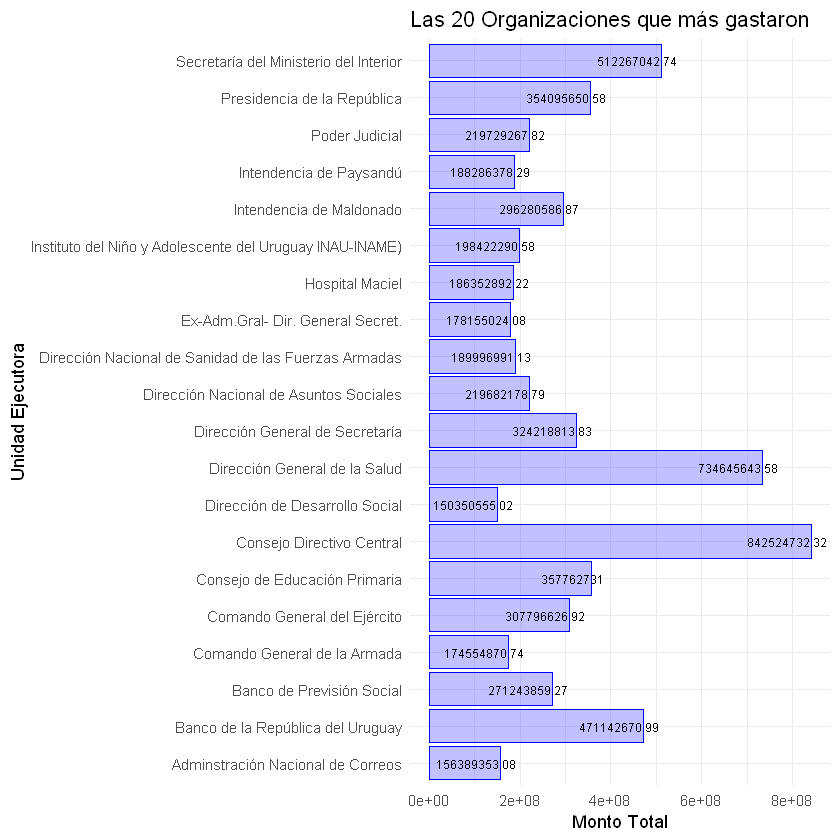

In [221]:
top20Pesos<-head(top20Pesos,20)
ggplot(top20Pesos, aes(x = top20Pesos$Unidad_Ejecutora, y = top20Pesos$MontoTotal)) +
  ggtitle ("Las 20 Organizaciones que más gastaron") +
  labs(x="Unidad Ejecutora", y="Monto Total") + 
  geom_bar(stat = "identity",fill = rgb(0.2, 0.2, 1, 0.3), color = "blue") +
  geom_text(size=2.5,aes(hjust=0.8, label = top20Pesos$MontoTotal),position = position_dodge(width=1)) + 
  coord_flip() +
  theme_minimal()

In [151]:
print("TOP DE LOS 20 INCISOS QUE GASTARON MÁS DINERO EN PESOS URUGUAYOS")

top20Incisos <- datosComprasEstatales2018 %>% filter(!is.na(monto_compra),monto_compra>0,monto_compra < max(monto_compra),desc_moneda=="PESOS URUGUAYOS")%>%
                                            group_by(Inciso=nombre_inciso) %>%
                                            summarise(MontoTotal= sum(monto_compra)) %>%
                                            arrange(-MontoTotal,Inciso)
head(top20Incisos,20)

print("TOP DE LOS 20 INCISOS QUE GASTARON MÁS DINERO EN PESOS URUGUAYOS")
summary(head(top20Incisos$MontoTotal,20))

[1] "TOP DE LOS 20 INCISOS QUE GASTARON MÁS DINERO EN PESOS URUGUAYOS DISCRIMINANDO POR UNIDAD EJECUTORA"


Inciso,MontoTotal
Administración Nacional de Educación Pública,1380717850
Administración de Servicios de Salud del Estado,1346775670
Ministerio del Interior,1004847648
Ministerio de Salud Pública,874461246
Ministerio de Defensa Nacional,828644387
Banco de la República Oriental del Uruguay,471142671
Ministerio de Desarrollo Social,385774485
Ministerio de Economía y Finanzas,369581021
Universidad de la República,362559453
Diversos Créditos,354095651


[1] "RESUMEN DE LAS 20 DE LAS ORGANIZACIONES QUE GASTARON MÁS DINERO EN PESOS URUGUAYOS"


     Min.   1st Qu.    Median      Mean   3rd Qu.      Max. 
1.564e+08 2.382e+08 3.252e+08 4.860e+08 5.605e+08 1.381e+09 

#### TOP 50 DE LAS COMPRAS MÁS CARAS

In [133]:
# Se deja fuera de los monto_compra negativos, iguales a cero y se quita el máximo valor observado por entenderse que no 
# son representativos. Su análisis y justificación se encuentra detallada anteriormente.

# Cantidad de compras por tipo de moneda
datosComprasEstatales2018 %>% filter(!is.na(monto_compra),monto_compra>0,monto_compra < max(monto_compra)) %>%
                              group_by(Tipo_Moneda=desc_moneda) %>%
                              summarise(Cantidad=n()) %>%
                              arrange(-Cantidad)

cantCompras <- datosComprasEstatales2018 %>% filter(!is.na(monto_compra),monto_compra>0,monto_compra < max(monto_compra)) %>%
                                             count()


Tipo_Moneda,Cantidad
PESOS URUGUAYOS,49657
DOLAR PIZARRA VENDEDOR,2953
DOLAR INTERBANCARIO VENDEDOR,217
DLS.USA BILLETE,156
DOLAR PIZARRA COMPRADOR,76
DOLAR INTERBANCARIO COMPRADOR,70
DOLAR PROMEDIO,43
EURO,30
UNIDAD REAJUSTABLE,21
UNIDAD INDEXADA,5


In [138]:
# En base a los resultados obtenidos se considera conveniente organizar los resultados discriminando por PESOS URUGUAYOS Y DOLAR,
# dado que representan la cantidad más significativas de compras.

print("TOP DE LAS 50 COMPRAS MÁS CARAS EN PESOS URUGUAYOS")

top50Pesos <- datosComprasEstatales2018 %>% select(fecha_compra,nombre_inciso, nombre_uni_ejecutora, desc_tipo_compra, objeto_compra, monto_compra,desc_moneda) %>%
                                            filter(!is.na(monto_compra),monto_compra>0,monto_compra < max(monto_compra),desc_moneda=="PESOS URUGUAYOS")%>%
                                            arrange(desc(monto_compra))
head(top50Pesos,50)

print("RESUMEN DE LAS 50 COMPRAS MÁS CARAS EN PESOS URUGUAYOS")
summary(head(top50Pesos$monto_compra,50))

[1] "TOP DE LAS 50 COMPRAS MÁS CARAS EN PESOS URUGUAYOS"


fecha_compra,nombre_inciso,nombre_uni_ejecutora,desc_tipo_compra,objeto_compra,monto_compra,desc_moneda
06/08/2018,Diversos Créditos,Presidencia de la República,Compra por Excepción,P 3625 SP 03/2018 IMPLANTACION Y EVOLUCION DE TRAMITES EN LINEA,139637540,PESOS URUGUAYOS
29/05/2018,Administración Nacional de Educación Pública,Consejo Directivo Central,Licitación Pública,"OBRAS DE CONSTRUCCION DEL NUEVO LOCAL DE LA ESCUELA N°181 DE MONTEVIDEO, EN EL PREDIO UBICADO EN LA CALLE SEBASTOPOL Y COCHABAMBA.",104198119,PESOS URUGUAYOS
19/09/2018,Intendencia de Maldonado,Intendencia de Maldonado,Licitación Pública,"(LA INTENDENCIA DE MALDONADO NO RECIBE OFERTAS EN LINEA) EJECUCION DE OBRAS DE REMODELACION DE LA RAMBLA COSTANERA DE LOS BALNEARIOS SAN FRANCISCO, PUNTA COLORADA Y OTRAS CALLES Y CAMINOS DE LA ZONA.",92022549,PESOS URUGUAYOS
19/09/2018,Intendencia de Maldonado,Intendencia de Maldonado,PFI - Licitación pública internacional,"(LA INTENDENCIA DE MALDONADO NO RECIBE OFERTAS EN LINEA) EJECUCION DE OBRAS DE CONSTRUCCION DE 54 VIVIENDAS EN ""CANADA APARICIO"" PARA REALOJAR FAMILIAS DEL ASENTAMIENTO ""SAN ANTONIO IV""",88900627,PESOS URUGUAYOS
28/08/2018,Administración Nacional de Educación Pública,Consejo Directivo Central,Licitación Pública,CONSTRUCCION DE LOCAL DEL LICEO N° 22 DE MONTEVIDEO.,71825677,PESOS URUGUAYOS
28/12/2017,Ministerio del Interior,Secretaría del Ministerio del Interior,Compra por Excepción,"OBRAS EN MODULOS A, B, C Y D EN SEDE DE CORACEROS.",65883603,PESOS URUGUAYOS
15/05/2018,Administración Nacional de Educación Pública,Consejo Directivo Central,Licitación Pública,CONSTRUCCION DE LOCAL PARA EL LICEO N° 2 DE TOLEDO DEL DEPARTAMENTO DE CANELONES.,62377120,PESOS URUGUAYOS
09/10/2018,Administración Nacional de Educación Pública,Consejo Directivo Central,Licitación Pública,CONSTRUCCION DE LOCAL DEL CBT DE TOLEDO DEL DEPARTAMENTO DE CANELONES.,54635047,PESOS URUGUAYOS
24/08/2018,Intendencia de Río Negro,Intendencia de Río Negro,Licitación Pública,"DISENO DEL PROYECTO EJECUTIVO Y LA CONSTRUCCION DE LAS OBRAS NECESARIAS PARA LA TERMINAL DE OMNIBUS EN LA CIUDAD DE YOUNG, DEPARTAMENTO DE RIO NEGRO",51741143,PESOS URUGUAYOS
15/10/2018,Diversos Créditos,Presidencia de la República,Compra por Excepción,SERVICIOS DE DESARROLLO DE SOFTWARE Y MANTENIMIENTO DE APLICACIONES AGESIC,50958180,PESOS URUGUAYOS


[1] "RESUMEN DE LAS 50 COMPRAS MÁS CARAS EN PESOS URUGUAYOS"


     Min.   1st Qu.    Median      Mean   3rd Qu.      Max. 
 20370207  26056640  37891864  42581668  47570268 139637540 

In [139]:
print("TOP DE LAS 50 COMPRAS MÁS CARAS EN DOLAR PIZARRA VENDEDOR")

top50Dolares <- datosComprasEstatales2018 %>% select(fecha_compra,nombre_inciso, nombre_uni_ejecutora, desc_tipo_compra, objeto_compra, monto_compra,desc_moneda) %>%
                                            filter(!is.na(monto_compra),monto_compra>0,monto_compra < max(monto_compra),desc_moneda=="DOLAR PIZARRA VENDEDOR")%>%
                                            arrange(desc(monto_compra))
head(top50Dolares,50)

print("RESUMEN DE LAS 50 COMPRAS MÁS CARAS EN DOLAR PIZARRA VENDEDOR")
summary(head(top50Dolares$monto_compra,50))


[1] "TOP DE LAS 50 COMPRAS MÁS CARAS EN DOLAR PIZARRA VENDEDOR"


fecha_compra,nombre_inciso,nombre_uni_ejecutora,desc_tipo_compra,objeto_compra,monto_compra,desc_moneda
06/08/2018,Ministerio de Salud Pública,Dirección General de la Salud,Compra por Excepción,VACUNAS PAI 2018,9975911.8,DOLAR PIZARRA VENDEDOR
19/11/2018,Ministerio del Interior,Secretaría del Ministerio del Interior,Licitación Pública,"ARRENDAMIENTO DE 500 DISPOSITIVOS PARA MONITOREO Y SUPERVISION ELECTRONICA DE SITUACIONES DE LIBERTAD ASISTIDA Y 600 DISPOSITIVOS DE VERIFICACION DE PRESENCIA Y LOCALIZACION DE PERSONAS, DESTINADAS A AGRESOR Y VICTIMA DE VIOLENCIA DOMESTICA",4627799.9,DOLAR PIZARRA VENDEDOR
17/09/2018,Diversos Créditos,Presidencia de la República,Licitación Pública,ADQUISICION DE PRODUCTOS Y SERVICIOS VMWARE A TRAVES DE UN ELA (ENTERPRISE LICENSE AGREEMENT),4269722.0,DOLAR PIZARRA VENDEDOR
03/07/2018,Administración Nacional de Educación Pública,Consejo Directivo Central,Licitación Pública,"LICITACION PUBLICA NACIONAL 4/18, OBRA NUEVA, ESCUELA N°319 ""REPUBLICA POPULAR CHINA""",2565844.0,DOLAR PIZARRA VENDEDOR
08/10/2018,Diversos Créditos,Presidencia de la República,Compra por Excepción,"SP 06/2018 - ""DGR DIGITAL""",1751840.7,DOLAR PIZARRA VENDEDOR
06/09/2018,Ministerio del Interior,Secretaría del Ministerio del Interior,Compra por Excepción,ADQUISICION DE GASTA 300.000 LIBRETAS DE PASAPORTES CON CHIP,1537500.0,DOLAR PIZARRA VENDEDOR
30/11/2018,Diversos Créditos,Presidencia de la República,Compra por Excepción,SERVICIOS PARA LA CALIDAD DE SOFTWARE,1392172.5,DOLAR PIZARRA VENDEDOR
05/11/2018,Presidencia de la República,Secretaría Nacional del Deporte,Compra por Excepción,ADQUISICION DE INMUEBLE PARA ESTA SECRETARIA,1200000.0,DOLAR PIZARRA VENDEDOR
11/10/2018,Ministerio del Interior,Secretaría del Ministerio del Interior,Licitación Pública,"ADQUISICION DE NEUMATICOS, HASTA LAS CANTIDADES Y SEGUN LAS ESPECIFICACIONES ESTABLECIDAS EN EL ANEXO II ESPECIFICACIONES TECNICAS, DE LOS PRESENTES PLIEGOS.",1188978.1,DOLAR PIZARRA VENDEDOR
06/09/2018,Ministerio del Interior,Secretaría del Ministerio del Interior,Licitación Pública,ADQUISICION DE HASTA 25 VEHICULOS ESPECIALES DE PRIMERA RESPUESTA PARA LA DIRECCION NACIONAL DE BOMBEROS. PRESENTACION DE OFERTAS EXCLUSIVAMENTE EN FORMA PRESENCIAL.,1158425.0,DOLAR PIZARRA VENDEDOR


[1] "RESUMEN DE LAS 50 COMPRAS MÁS CARAS EN DOLAR PIZARRA VENDEDOR"


   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
 240991  326244  477900  928339  613034 9975912 

In [255]:
top50Pesos<-head(top50Pesos,50)
top50Dolares<-head(top50Dolares,50)
dfTop50 <- data.frame(top50Pesos$monto_compra,top50Dolares$monto_compra)
      

#### AGREGACIÓN DEL MONTO TOTAL POR TIPO DE PRODUCTO

In [122]:
# Se separan las compras con tipo de producto no especificado. La cantidad puede ser poco representantiva por la variabilidad
# en el contenido del campo en sí. No hay un estándar que permita realizar un agrupamiento por concepto de compra.
# Como se especificó anteriormente se realizaron distintas técnicas de transformación y limpieza de datos que permitieron 
# depurar el dataset final pero así mismo el porcentaje base de registros sobre los que se trabaja es muy inferior a la muestra total.
# El negocio debería decidir si se busca otro data set para obtener la información porque con la que se cuenta actualmente no es
# posible.

# Cantidad de compras por tipo de moneda
datosComprasEstatales2018 %>% filter(!is.na(monto_compra),monto_compra>0,monto_compra < max(monto_compra)) %>%
                              group_by(Tipo_Moneda=desc_moneda) %>%
                              summarise(Cantidad=n()) %>%
                              arrange(-Cantidad)

cantCompras <- datosComprasEstatales2018 %>% filter(!is.na(monto_compra),monto_compra>0,monto_compra < max(monto_compra)) %>%
                                             count()

#cantCompras # Cantidad de compras consideradas

Tipo_Moneda,Cantidad
PESOS URUGUAYOS,49657
DOLAR PIZARRA VENDEDOR,2953
DOLAR INTERBANCARIO VENDEDOR,217
DLS.USA BILLETE,156
DOLAR PIZARRA COMPRADOR,76
DOLAR INTERBANCARIO COMPRADOR,70
DOLAR PROMEDIO,43
EURO,30
UNIDAD REAJUSTABLE,21
UNIDAD INDEXADA,5


n
53245


In [131]:
# Considerando que de 53245 compras 49657 son en PESOS URUGUAYOS para poder responder al requerimiento se van a utilizar
# las compras sólo en PESOS URUGUAYOS. En caso de que el cliente lo desee se podrá realizar la conversión de las compras
# realizadas en otra moneda.

# En base al estudio de tipo de objeto de compra realizado anteriormente se decide mostrar dos análisis a este requerimiento, 
# uno con el data set sin filtro y otro buscando coincidencias por las 10 palabras más frecuentas con el objetivo de intentar
# incrementar el número de compras consideradas.

print("MONTO TOTAL POR TIPO DE PRODUCTO")

datosComprasEstatales2018 %>% filter(!is.na(objeto_compra),!is.na(monto_compra),monto_compra>0,monto_compra < max(monto_compra),desc_moneda=="PESOS URUGUAYOS") %>%
                              group_by(Objeto_Compra=objeto_compra) %>%
                              summarise(MontoTotal=sum(monto_compra), Cant_Compras=n()) %>%
                              arrange(desc(MontoTotal))

cant1 <- datosComprasEstatales2018 %>% filter(!is.na(objeto_compra),!is.na(monto_compra),monto_compra>0,monto_compra < max(monto_compra),desc_moneda=="PESOS URUGUAYOS") %>%
                              group_by(Objeto_Compra=objeto_compra) %>%
                              summarise(MontoTotal=sum(monto_compra), Cant_Compras=n()) %>%
                              arrange(desc(MontoTotal)) %>%
                              count()
print(paste("Cantidad de valores tomados para Monto total por tipo de producto: ", cant1))

[1] "MONTO TOTAL POR TIPO DE PRODUCTO"


Objeto_Compra,MontoTotal,Cant_Compras
P 3625 SP 03/2018 IMPLANTACION Y EVOLUCION DE TRAMITES EN LINEA,139637540,1
SOFTWARE,122546468,11
"OBRAS DE CONSTRUCCION DEL NUEVO LOCAL DE LA ESCUELA N°181 DE MONTEVIDEO, EN EL PREDIO UBICADO EN LA CALLE SEBASTOPOL Y COCHABAMBA.",104198119,1
"(LA INTENDENCIA DE MALDONADO NO RECIBE OFERTAS EN LINEA) EJECUCION DE OBRAS DE REMODELACION DE LA RAMBLA COSTANERA DE LOS BALNEARIOS SAN FRANCISCO, PUNTA COLORADA Y OTRAS CALLES Y CAMINOS DE LA ZONA.",92022549,1
"(LA INTENDENCIA DE MALDONADO NO RECIBE OFERTAS EN LINEA) EJECUCION DE OBRAS DE CONSTRUCCION DE 54 VIVIENDAS EN ""CANADA APARICIO"" PARA REALOJAR FAMILIAS DEL ASENTAMIENTO ""SAN ANTONIO IV""",88900627,1
CONSTRUCCION DE LOCAL DEL LICEO N° 22 DE MONTEVIDEO.,71825677,1
LIMPIEZA DE LOCALES ESCOLARES,66004164,16
"OBRAS EN MODULOS A, B, C Y D EN SEDE DE CORACEROS.",65883603,1
CONSTRUCCION DE LOCAL PARA EL LICEO N° 2 DE TOLEDO DEL DEPARTAMENTO DE CANELONES.,62377120,1
CONSTRUCCION DE LOCAL DEL CBT DE TOLEDO DEL DEPARTAMENTO DE CANELONES.,54635047,1


[1] "Cantidad de valores tomados para Monto total por tipo de producto:  37603"


In [132]:
print("MONTO TOTAL POR TIPO DE PRODUCTO CONSIDERANDO COINCIDENCIAS POR PALABRAS MÁS FRECUENTES PARA AGRUPAR")
datosComprasEstatales2018 %>% filter(!is.na(objeto_compra),!is.na(monto_compra),monto_compra>0,monto_compra < max(monto_compra),desc_moneda=="PESOS URUGUAYOS", 
                                     str_detect(objeto_compra,'FERRETERIA|MEDICAMENTO|PASAJE|ESTUDIO|LIMPIEZA|PUBLICACION|MANTENIMIENTO|VEHICULO|REPUESTO|REPARACION')) %>%
                                     group_by(Objeto_Compra=objeto_compra) %>%
                                     summarise(MontoTotal=sum(monto_compra), Cant_Compras=n()) %>%
                                     arrange(desc(MontoTotal))

cant2 <- datosComprasEstatales2018 %>% filter(!is.na(objeto_compra),!is.na(monto_compra),monto_compra>0,monto_compra < max(monto_compra),desc_moneda=="PESOS URUGUAYOS", 
                                     str_detect(objeto_compra,'FERRETERIA|MEDICAMENTO|PASAJE|ESTUDIO|LIMPIEZA|PUBLICACION|MANTENIMIENTO|VEHICULO|REPUESTO|REPARACION')) %>%
                                     group_by(Objeto_Compra=objeto_compra) %>%
                                     summarise(MontoTotal=sum(monto_compra), Cant_Compras=n()) %>%
                                     arrange(desc(MontoTotal))%>%
                                     count()
print(paste("Cantidad de valores tomados para Monto total por tipo de producto por palabra coincidente: ", cant2))

[1] "MONTO TOTAL POR TIPO DE PRODUCTO CONSIDERANDO COINCIDENCIAS POR PALABRAS MÁS FRECUENTES PARA AGRUPAR"


Objeto_Compra,MontoTotal,Cant_Compras
LIMPIEZA DE LOCALES ESCOLARES,66004164,16
COMPRA DE MEDICAMENTO,53519277,399
SERVICIOS DE DESARROLLO DE SOFTWARE Y MANTENIMIENTO DE APLICACIONES AGESIC,50958180,1
LIMPIEZA INTEGRAL SANATORIO Y MANTENIMIENTO DE JARDINES Y ESPACIOS VERDES,50632898,1
SERVICIO DE LIMPIEZA,41968157,39
"""MANTENIMIENTO POR NIVELES DE SERVICIO DE LA SENALIZACION VERTICAL EN RUTAS DE LA REGIONAL 8""",40222953,1
CONTRATACION DE VEHICULOS CON CHOFER PARA CUSTODIA DE BLINDADOS,40000000,1
CONTRATACION DE SERVICIO QUE SUMINISTRE AUXILIARES DE LIMPIEZA Y PEONES PARA EL CENTRO HOSPITALARIO.,36925740,1
CONTRATACION DE SERVICIOS DE DESARROLLO Y MANTENIMIENTO DE APLICACIONES DE SOFTWARE CON PAQUETE DE 25.000 HORAS,36168120,1
CONTRATACION DE UNA EMPRESA PARA LA PRESTACION DE UN SERVICIO DE LIMPIEZA INTEGRAL PARA ESTA SECRETARIA DE ESTADO Y OTRAS DEPENDENCIAS,35776179,1


[1] "Cantidad de valores tomados para Monto total por tipo de producto por palabra coincidente:  8142"


Se observa que sin buscar coincidencia entre las palabras, los registros considerados son más pero el agrupamiento entre ellos es diferente.
Mientras que en la segunda opción, si bien son menos observaciones los grupos contienen más cantidad de asociaciones.

#### TOP DE LAS 10 UNIDADES EJECUTORAS QUE MÁS COMPRARON EN EL PERÍODO

In [118]:
# No se consideran las compras negativas, iguales a $0 y la compra con mayor monto.
print("LAS DIEZ UNIDADES EJECUTORAS QUE MÁS COMPRARON EN EL PERÍODO")
diezUEmasCompras <- datosComprasEstatales2018 %>% filter(!is.na(monto_compra), monto_compra > 0, monto_compra < max(monto_compra)) %>%
                              group_by(Unidad_Ejecutora=nombre_uni_ejecutora) %>% 
                              summarise(Cant_Compras=n())%>% 
                              arrange(desc(Cant_Compras))

head(diezUEmasCompras,10)


[1] "LAS DIEZ UNIDADES EJECUTORAS QUE MÁS COMPRARON EN EL PERÍODO"


Unidad_Ejecutora,Cant_Compras
Dirección General de la Salud,3932
Dirección General de Secretaría,2708
Hospital Maciel,2396
Adminstración Nacional de Correos,2094
Dirección Nacional de Arquitectura,1377
Dirección General de Servicios Ganaderos,1137
Centro Departamental de Rocha,1090
Consejo de Educación Primaria,1061
Secretaría del Ministerio del Interior,964
Dirección Nacional de Cultura,913


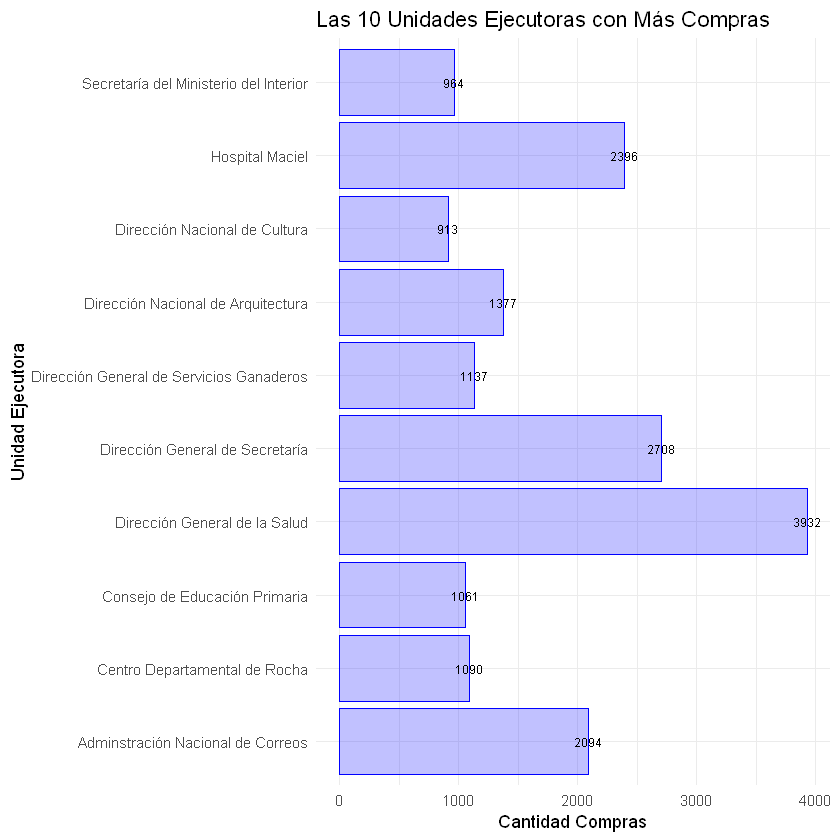

In [259]:
diezUEmasCompras<-head(diezUEmasCompras,10)
ggplot(diezUEmasCompras, aes(x = diezUEmasCompras$Unidad_Ejecutora, y = diezUEmasCompras$Cant_Compras)) +
  ggtitle ("Las 10 Unidades Ejecutoras con Más Compras") +
  labs(x="Unidad Ejecutora", y="Cantidad Compras") + 
  geom_bar(stat = "identity",fill = rgb(0.2, 0.2, 1, 0.3), color = "blue") +
  geom_text(size=2.5,aes(hjust=0.5, label = diezUEmasCompras$Cant_Compras),position = position_dodge(width=1)) + 
  coord_flip() +
  theme_minimal()

#### COMPRAS DIRECTAS MAYORES A $ 436.000

In [106]:
# Para llevar a cabo el análisis de este requerimiento se consideran como base únicamente las compras realizadas 
# en PESOS URUGUAYOS que son las controladas en su regulación por el T.O.C.A.F, del tipo DIRECTA.
# Como se mencionó con anterioridad se filtran los valores negativos, 0 y se quita el monto máximo que corresponde a $ URUGUAYOS

# Conocemos el resumen de la compra que excede ampliamente las demás para verificar que es en PESOS URUGUAYOS
datosComprasEstatales2018 %>% select(fecha_compra,nombre_inciso, nombre_uni_ejecutora, desc_tipo_compra, objeto_compra, monto_compra,desc_moneda) %>%
                              filter(monto_compra == max(monto_compra))

fecha_compra,nombre_inciso,nombre_uni_ejecutora,desc_tipo_compra,objeto_compra,monto_compra,desc_moneda
23/10/2018,Administración Nacional de Educación Pública,Consejo de Educación Técnico-Profesional,Compra por Excepción,ADECUACION DE LABORATORIOS EN ERCNA CARMELO.,368738393981,PESOS URUGUAYOS


In [110]:
print("COMPRAS DIRECTAS MAYORES A $436.000")

datosComprasEstatales2018 %>% select(fecha_compra,nombre_inciso, nombre_uni_ejecutora, desc_tipo_compra, desc_tipo_compra, monto_compra,desc_moneda) %>%
                              filter(!is.na(monto_compra), monto_compra > 436000, monto_compra < max(monto_compra), desc_moneda=="PESOS URUGUAYOS", desc_tipo_compra=="Compra Directa") %>%
                              arrange(-monto_compra)

cantComprasIrregulares <- datosComprasEstatales2018 %>% select(fecha_compra,nombre_inciso, nombre_uni_ejecutora, desc_tipo_compra, objeto_compra, monto_compra,desc_moneda) %>%
                              filter(!is.na(monto_compra), monto_compra > 436000, monto_compra < max(monto_compra), desc_moneda=="PESOS URUGUAYOS", desc_tipo_compra=="Compra Directa") %>%
                              count()

print(paste("Cantidad de Compras Directas mayores a $436.000: ", cantComprasIrregulares))


[1] "COMPRAS DIRECTAS MAYORES A $436.000"


fecha_compra,nombre_inciso,nombre_uni_ejecutora,desc_tipo_compra,monto_compra,desc_moneda
01/03/2018,Ministerio de Salud Pública,Dirección General de Secretaría,Compra Directa,11858400,PESOS URUGUAYOS
19/03/2018,Ministerio de Salud Pública,Dirección General de la Salud,Compra Directa,8600658,PESOS URUGUAYOS
29/12/2017,Presidencia de la República,Secretaría Nacional del Deporte,Compra Directa,5493584,PESOS URUGUAYOS
27/07/2018,Ministerio de Salud Pública,Dirección General de la Salud,Compra Directa,4357646,PESOS URUGUAYOS
09/07/2018,Ministerio de Salud Pública,Dirección General de la Salud,Compra Directa,3538800,PESOS URUGUAYOS
02/10/2018,Ministerio de Salud Pública,Dirección General de la Salud,Compra Directa,3076388,PESOS URUGUAYOS
28/11/2017,Ministerio de Salud Pública,Dirección General de Secretaría,Compra Directa,2978583,PESOS URUGUAYOS
03/10/2018,Ministerio de Salud Pública,Dirección General de la Salud,Compra Directa,2805471,PESOS URUGUAYOS
23/03/2018,Ministerio de Salud Pública,Dirección General de la Salud,Compra Directa,2729549,PESOS URUGUAYOS
07/03/2018,Ministerio de Salud Pública,Dirección General de la Salud,Compra Directa,2705266,PESOS URUGUAYOS


[1] "Cantidad de Compras Directas mayores a $436.000:  324"


In [112]:
cantComprasDirectas <- datosComprasEstatales2018 %>% select(fecha_compra,nombre_inciso, nombre_uni_ejecutora, desc_tipo_compra, objeto_compra, monto_compra,desc_moneda) %>%
                              filter(!is.na(monto_compra), monto_compra < max(monto_compra), desc_moneda=="PESOS URUGUAYOS", desc_tipo_compra=="Compra Directa") %>%
                              count()
print(paste("De: ", cantComprasDirectas, "compras directas, incumplieron a los montos máximos establecidos por el T.O.C.A.F: ", cantComprasIrregulares))

[1] "De:  47332 compras directas, incumplieron a los montos máximos establecidos por el T.O.C.A.F:  324"


In [260]:
print("RESUMEN COMPRAS DIRECTAS MAYORES A $436.000 POR UNIDAD EJECUTORA")
datosComprasEstatales2018 %>% filter(!is.na(monto_compra), monto_compra > 436000, monto_compra < max(monto_compra), desc_moneda=="PESOS URUGUAYOS", desc_tipo_compra=="Compra Directa") %>%
                              group_by(Unidad_Ejecutora=nombre_uni_ejecutora) %>%
                              summarise(Monto_Min=min(monto_compra), Media=mean(monto_compra), Monto_Max= max(monto_compra),Cantidad=n()) %>%
                              arrange(-Monto_Max)


[1] "RESUMEN COMPRAS DIRECTAS MAYORES A $436.000 POR UNIDAD EJECUTORA"


Unidad_Ejecutora,Monto_Min,Media,Monto_Max,Cantidad
Dirección General de Secretaría,577231.0,2618122.7,11858400,8
Dirección General de la Salud,476314.0,1536848.5,8600658,86
Secretaría Nacional del Deporte,439200.0,1406385.5,5493584,17
Comando General del Ejército,450241.2,721857.4,1306974,26
Comando General de la Fuerza Aérea,441259.7,842948.6,1306968,22
Dirección Nacional de Sanidad de las Fuerzas Armadas,440658.7,798041.8,1306937,57
Adminstración Nacional de Correos,447419.1,718225.2,1281892,41
Banco de Previsión Social,438454.1,725739.9,1185840,54
Instituto Nacional de Colonización,855600.6,1013400.3,1171200,2
Banco Hipotecario del Uruguay,546157.4,833801.3,1156560,4


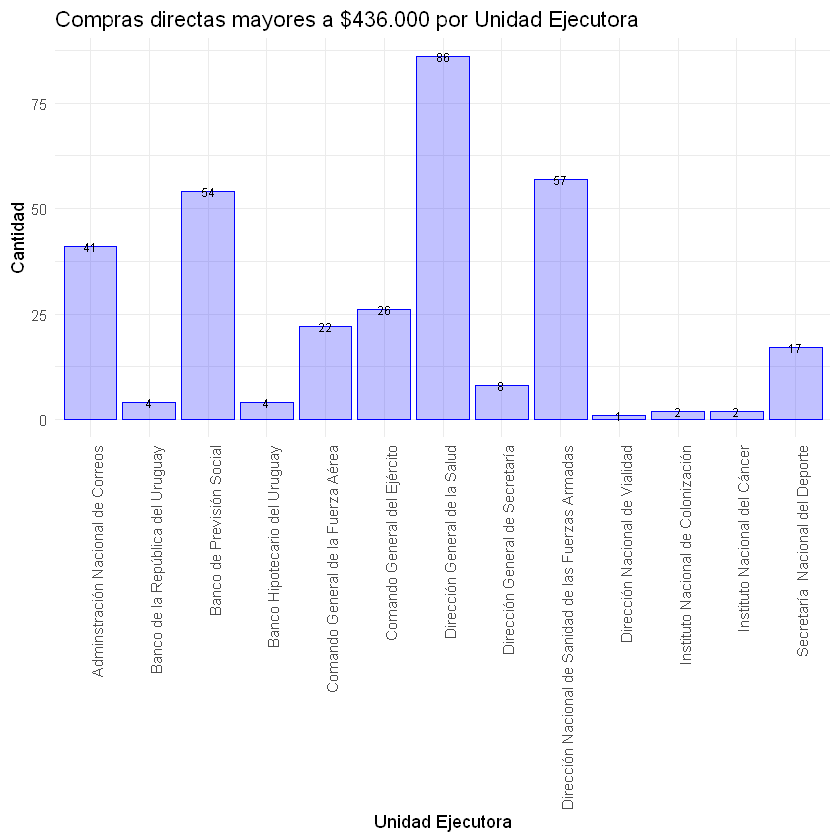

In [280]:
filtro <-datosComprasEstatales2018 %>% filter(!is.na(monto_compra), monto_compra > 436000, monto_compra < max(monto_compra), desc_moneda=="PESOS URUGUAYOS", desc_tipo_compra=="Compra Directa") %>%
                              group_by(Unidad_Ejecutora=nombre_uni_ejecutora) %>%
                              summarise(Monto_Min=min(monto_compra), Media=mean(monto_compra), Monto_Max= max(monto_compra),Cantidad=n()) %>%
                              arrange(-Monto_Max)

ggplot(filtro, aes(x = filtro$Unidad_Ejecutora, y = filtro$Cantidad)) +
  ggtitle ("Compras directas mayores a $436.000 por Unidad Ejecutora") +
  labs(x="Unidad Ejecutora", y="Cantidad") + 
  geom_bar(stat = "identity",fill = rgb(0.2, 0.2, 1, 0.3), color = "blue") +
  geom_text(size=2.5,aes(hjust=0.5, label = filtro$Cantidad),position = position_dodge(width=1)) + 
  theme_minimal() +
  theme(axis.text.x = element_text(angle = 90, hjust = 1))

  